In [1]:
%matplotlib inline

import numpy as np
import copy
import matplotlib.pyplot as plt
import pickle
import random
import torch
from utils import torch_from_numpy
import datetime

from config import cfg_seed, cfg_env, cfg_z_dim, cfg_default_lr, cfg_default_early
seed = cfg_seed
env_str=cfg_env
default_lr=cfg_default_lr
default_early=cfg_default_early

from config import cfg_alpha
alpha=cfg_alpha

num_iter_max=200000

env_name = 'CustomPendulum-v0'
figfilenamehead = "fig_policy_evaluation_"+env_str+"_"

loss_list = []
normalized_loss_list = []

print("alpha",alpha)
print(datetime.datetime.now())

alpha 0.1
2023-06-10 07:12:44.786745


In [2]:
import gym
import custom_gym
env = gym.make(env_name)

random.seed(seed)
np.random.seed(seed)

env.seed(seed)
env.action_space.seed(seed)
torch.manual_seed(seed)


s_dim = env.reset().flatten().shape[0]
a_dim = env.action_space.sample().flatten().shape[0]
z_dim = cfg_z_dim
print(s_dim, a_dim, z_dim)



2 1 1


/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/core.py:329: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:174: UserWarning: WARN: Future gym versions will require that `Env.reset` can be passed a `seed` instead of using `Env.seed` for resetting the environment random number generator.
  logger.warn(
/home/proxima-hishinuma/anaconda3/

In [3]:


from sac import SAC
agent = SAC(env.observation_space.shape[0], env.action_space)
agent.load_checkpoint(ckpt_path="checkpoints/sac_checkpoint_custom_"+env_str+"_mdp_")


offline_data = pickle.load(open("offline_data_"+env_str+".pkl","rb"))
debug_info = pickle.load(open("offline_data_debug_info_"+env_str+".pkl","rb"))
debug_info = np.array(debug_info)

Loading models from checkpoints/sac_checkpoint_custom_pendulum_mdp_


In [4]:
args_init_dict = {
    "offline_data": offline_data,
    "s_dim": s_dim,
    "a_dim": a_dim,
    "z_dim": z_dim,
    #              "policy":agent.select_action,
    "mdp_policy":agent.policy.my_np_select_action,
    "bamdp_policy":None,
    "debug_info":debug_info,
    "env" : env,
    "ckpt_suffix" : env_str,
}
# import vi_base
# vi = vi_base.baseVI(args_init_dict)
import vi_iw
iwvi = vi_iw.iwVI(args_init_dict)

iwvi.load_base(ckpt_key="unweighted") # 重みなし学習結果だけをロード

dec: h_dim 64
base load ckpt ckpt_basevi_pendulum_unweighted
base load self.initial_belief.data.sum() tensor(0.2856)
base load dec.state_dict()['net_phat.0.weight'].sum() tensor(5.5642)
penalty_target_min tensor(-5.9433) penalty_target_max tensor(11.1326)
train_loss:  -3.8218568494915957
valid_loss:  -4.128176867485047
h_min_tilde -5.943334 ell_tilde -3.883120853090286 kappa_tilde 0.0006966969544711039


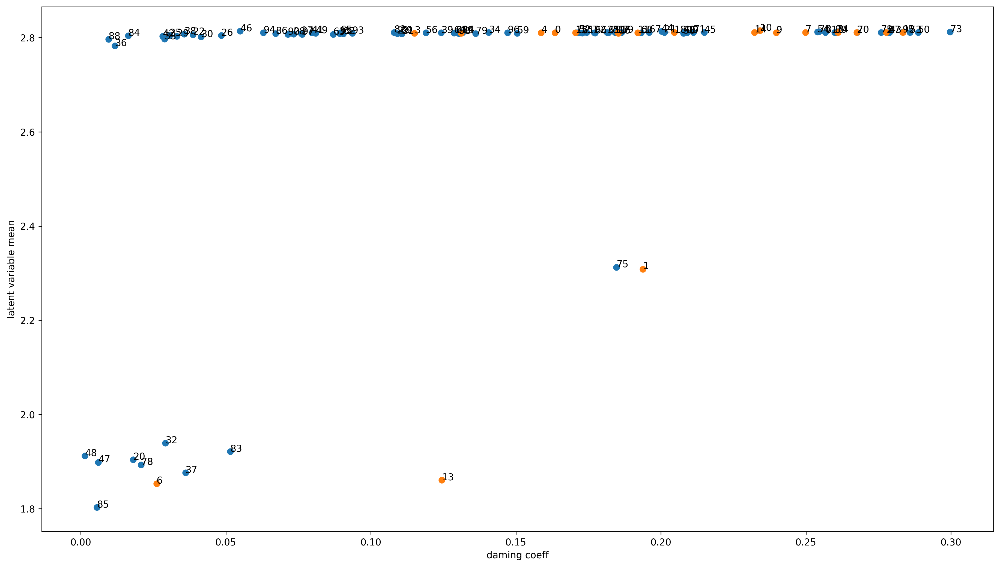

[0.16346495 0.19376823 0.2675319  0.11503246 0.15866848 0.27767899
 0.02613879 0.24978595 0.26100364 0.23974757]
[0.23415875 0.19197631 0.28340068 0.12439858 0.23227011 0.17053018
 0.18529065 0.1850802  0.20454609 0.13110959]
[0.01806764 0.20119136 0.03867789 0.10911323 0.13158045 0.03061344
 0.04839286 0.07598748 0.07332768 0.03311254]
[0.04145489 0.11061755 0.02913038 0.02882952 0.14059536 0.18145366
 0.01175634 0.03605897 0.03561832 0.1242789 ]
[0.20774164 0.07961685 0.02818215 0.27878886 0.20022311 0.21489816
 0.05495741 0.00603226 0.00140864 0.08100239]
[0.28865656 0.1728472  0.17167557 0.2858247  0.2539226  0.08923109
 0.11895172 0.17438186 0.20775948 0.15039731]
[0.19319706 0.18191796 0.09047245 0.08702328 0.12863061 0.0894847
 0.17726183 0.19596025 0.12942553 0.11026856]
[0.26757701 0.21116658 0.27584478 0.2996541  0.26043782 0.18466787
 0.25440247 0.17073022 0.0207501  0.1360628 ]
[0.2599147  0.256741   0.10799342 0.0514889  0.0163014  0.00555654
 0.06717741 0.27842439 0.00955

In [5]:
plt.figure(figsize=(18,10), dpi=250)
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()
plt.xlabel("daming coeff")
plt.ylabel("latent variable mean")

plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.xlim([-0.05,0.35])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter0.png")
plt.savefig(figfilenamehead+"damping_latent_iter0.eps")
# plt.savefig(figfilenamehead+"damping_latent_iter0.pdf")
plt.show()

for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [6]:
iwvi.get_real_rollout_mdppolicy_data()

0  1  2  

/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:227: DeprecationWarning: WARN: Core environment is written in old step API which returns one bool instead of two. It is recommended to rewrite the environment with new step API. 
  logger.deprecation(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(done, (bool, np.bool8)):
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:141: UserWarning: WARN: The obs returned by the `step()` method was expecting numpy array dtype to be float32, actual type: float64
  logger.warn(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:165: UserWarning: WARN: The obs returned by the `step()` method is not within the observ

3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   


In [7]:
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0d = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0e = copy.deepcopy(iwvi.simenv_rolloutdata)



0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56

実環境方策rollout vs Sim環境方策rollout


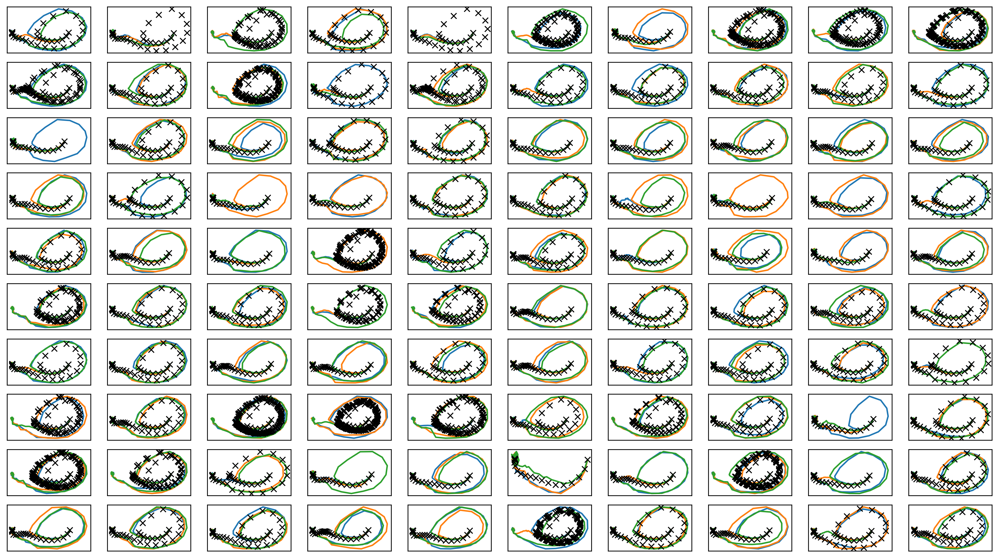

In [8]:
fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter0.png")
plt.savefig(figfilenamehead+"joint_iter0.eps")
# plt.savefig(figfilenamehead+"joint_iter0.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

In [9]:
print(datetime.datetime.now())

2023-06-10 07:13:13.112840


# Iter 1

In [10]:
iwvi.get_sim_rollout_mdppolicy_data_randomstop()

0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   


In [11]:
iwvi.train_ratio(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, policy=agent.select_action)


train: iter 0  trainloss 1.21457  validloss 1.45608±0.00000  bestvalidloss 1.45608  last_update 0
train: iter 1  trainloss 0.75484  validloss 0.90855±0.00000  bestvalidloss 0.90855  last_update 0
train: iter 2  trainloss 0.66480  validloss 0.68269±0.00000  bestvalidloss 0.68269  last_update 0
train: iter 3  trainloss 0.63693  validloss 0.64213±0.00000  bestvalidloss 0.64213  last_update 0
train: iter 4  trainloss 0.61319  validloss 0.62333±0.00000  bestvalidloss 0.62333  last_update 0
train: iter 5  trainloss 0.58707  validloss 0.58543±0.00000  bestvalidloss 0.58543  last_update 0
train: iter 6  trainloss 0.55960  validloss 0.56179±0.00000  bestvalidloss 0.56179  last_update 0
train: iter 7  trainloss 0.52729  validloss 0.54227±0.00000  bestvalidloss 0.54227  last_update 0
train: iter 8  trainloss 0.49127  validloss 0.52090±0.00000  bestvalidloss 0.52090  last_update 0
train: iter 9  trainloss 0.46042  validloss 0.52241±0.00000  bestvalidloss 0.52090  last_update 1
train: iter 10  trai

train: iter 83  trainloss 0.22029  validloss 0.20196±0.00000  bestvalidloss 0.20196  last_update 0
train: iter 84  trainloss 0.22075  validloss 0.20502±0.00000  bestvalidloss 0.20196  last_update 1
train: iter 85  trainloss 0.21795  validloss 0.20750±0.00000  bestvalidloss 0.20196  last_update 2
train: iter 86  trainloss 0.21882  validloss 0.20481±0.00000  bestvalidloss 0.20196  last_update 3
train: iter 87  trainloss 0.21893  validloss 0.20471±0.00000  bestvalidloss 0.20196  last_update 4
train: iter 88  trainloss 0.22114  validloss 0.20464±0.00000  bestvalidloss 0.20196  last_update 5
train: iter 89  trainloss 0.21723  validloss 0.20375±0.00000  bestvalidloss 0.20196  last_update 6
train: iter 90  trainloss 0.21677  validloss 0.20209±0.00000  bestvalidloss 0.20196  last_update 7
train: iter 91  trainloss 0.21626  validloss 0.19855±0.00000  bestvalidloss 0.19855  last_update 0
train: iter 92  trainloss 0.21793  validloss 0.19571±0.00000  bestvalidloss 0.19571  last_update 0
train: ite

train: iter 167  trainloss 0.18971  validloss 0.16693±0.00000  bestvalidloss 0.16693  last_update 0
train: iter 168  trainloss 0.18993  validloss 0.16556±0.00000  bestvalidloss 0.16556  last_update 0
train: iter 169  trainloss 0.19112  validloss 0.17074±0.00000  bestvalidloss 0.16556  last_update 1
train: iter 170  trainloss 0.19125  validloss 0.16654±0.00000  bestvalidloss 0.16556  last_update 2
train: iter 171  trainloss 0.18855  validloss 0.16703±0.00000  bestvalidloss 0.16556  last_update 3
train: iter 172  trainloss 0.18987  validloss 0.17666±0.00000  bestvalidloss 0.16556  last_update 4
train: iter 173  trainloss 0.18994  validloss 0.16441±0.00000  bestvalidloss 0.16441  last_update 0
train: iter 174  trainloss 0.19028  validloss 0.16895±0.00000  bestvalidloss 0.16441  last_update 1
train: iter 175  trainloss 0.18797  validloss 0.16754±0.00000  bestvalidloss 0.16441  last_update 2
train: iter 176  trainloss 0.18705  validloss 0.16990±0.00000  bestvalidloss 0.16441  last_update 3


train: iter 249  trainloss 0.17500  validloss 0.15760±0.00000  bestvalidloss 0.15266  last_update 1
train: iter 250  trainloss 0.17384  validloss 0.16127±0.00000  bestvalidloss 0.15266  last_update 2
train: iter 251  trainloss 0.17498  validloss 0.16168±0.00000  bestvalidloss 0.15266  last_update 3
train: iter 252  trainloss 0.17616  validloss 0.15736±0.00000  bestvalidloss 0.15266  last_update 4
train: iter 253  trainloss 0.17510  validloss 0.16986±0.00000  bestvalidloss 0.15266  last_update 5
train: iter 254  trainloss 0.17726  validloss 0.16627±0.00000  bestvalidloss 0.15266  last_update 6
train: iter 255  trainloss 0.17576  validloss 0.15984±0.00000  bestvalidloss 0.15266  last_update 7
train: iter 256  trainloss 0.17443  validloss 0.15642±0.00000  bestvalidloss 0.15266  last_update 8
train: iter 257  trainloss 0.17413  validloss 0.15602±0.00000  bestvalidloss 0.15266  last_update 9
train: iter 258  trainloss 0.17344  validloss 0.15308±0.00000  bestvalidloss 0.15266  last_update 10

train: iter 331  trainloss 0.16390  validloss 0.15274±0.00000  bestvalidloss 0.14557  last_update 7
train: iter 332  trainloss 0.17029  validloss 0.14743±0.00000  bestvalidloss 0.14557  last_update 8
train: iter 333  trainloss 0.16630  validloss 0.16149±0.00000  bestvalidloss 0.14557  last_update 9
train: iter 334  trainloss 0.16955  validloss 0.15108±0.00000  bestvalidloss 0.14557  last_update 10
train: iter 335  trainloss 0.16819  validloss 0.16401±0.00000  bestvalidloss 0.14557  last_update 11
train: iter 336  trainloss 0.16490  validloss 0.15491±0.00000  bestvalidloss 0.14557  last_update 12
train: iter 337  trainloss 0.16839  validloss 0.14963±0.00000  bestvalidloss 0.14557  last_update 13
train: iter 338  trainloss 0.16652  validloss 0.16505±0.00000  bestvalidloss 0.14557  last_update 14
train: iter 339  trainloss 0.16780  validloss 0.14777±0.00000  bestvalidloss 0.14557  last_update 15
train: iter 340  trainloss 0.16435  validloss 0.14938±0.00000  bestvalidloss 0.14557  last_upd

train: iter 413  trainloss 0.16349  validloss 0.15376±0.00000  bestvalidloss 0.14557  last_update 89
train: iter 414  trainloss 0.16198  validloss 0.15022±0.00000  bestvalidloss 0.14557  last_update 90
train: iter 415  trainloss 0.16379  validloss 0.14914±0.00000  bestvalidloss 0.14557  last_update 91
train: iter 416  trainloss 0.16031  validloss 0.15553±0.00000  bestvalidloss 0.14557  last_update 92
train: iter 417  trainloss 0.16049  validloss 0.15910±0.00000  bestvalidloss 0.14557  last_update 93
train: iter 418  trainloss 0.16128  validloss 0.16447±0.00000  bestvalidloss 0.14557  last_update 94
train: iter 419  trainloss 0.16261  validloss 0.14891±0.00000  bestvalidloss 0.14557  last_update 95
train: iter 420  trainloss 0.15958  validloss 0.14886±0.00000  bestvalidloss 0.14557  last_update 96
train: iter 421  trainloss 0.15941  validloss 0.15365±0.00000  bestvalidloss 0.14557  last_update 97
train: iter 422  trainloss 0.16033  validloss 0.14839±0.00000  bestvalidloss 0.14557  last_

([1.2145669981837273,
  0.7548407625406981,
  0.6647978216409683,
  0.636934582144022,
  0.6131882943212986,
  0.5870723433792591,
  0.5596009097993374,
  0.5272935681045056,
  0.49127236008644104,
  0.4604172382503748,
  0.4304102499037981,
  0.4087233733385801,
  0.3907074237242341,
  0.37286602035164834,
  0.36229623984545467,
  0.3512317778542638,
  0.3416288750246167,
  0.33406549096107485,
  0.3269432481378317,
  0.3196152994409204,
  0.3158369963988662,
  0.31446713469922544,
  0.3082942273467779,
  0.30297385454177855,
  0.30029245652258396,
  0.29598125722259283,
  0.29477880503982307,
  0.2898500895127654,
  0.286672636680305,
  0.2837672146037221,
  0.28283797912299635,
  0.2801938969641924,
  0.27779184374958277,
  0.27904966454952956,
  0.27419118136167525,
  0.26974446047097445,
  0.26904134824872017,
  0.26830515172332525,
  0.2665990056470037,
  0.26702685933560133,
  0.26240305304527284,
  0.2599229574203491,
  0.25664941696450116,
  0.25851915422827004,
  0.2565122373

In [12]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))
# print(loss_list)
# print(normalized_loss_list)

train_loss:  -0.5308990997433662
valid_loss:  -0.4918299018144608
weight_alpha 1.0 h_min_tilde -5.943334 ell_tilde -0.5230852601575852 kappa_tilde 0.0004295269195032323
train_loss:  -1.914537316326797
valid_loss:  -1.9756949403762818
weight_alpha 0.1 h_min_tilde -5.943334 ell_tilde -1.9267688411366939 kappa_tilde 0.0004989678758163871


1e-08 1000.0


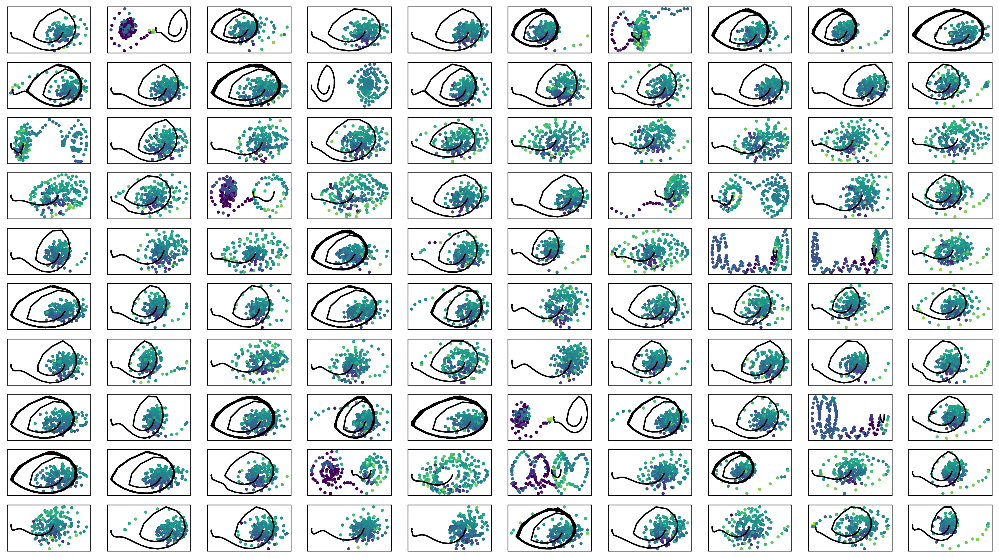

In [13]:

def f(x):
#     return x
    return np.log10(x)

fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter1.png")

In [14]:

train_curve1, valid_curve1 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()

# train_curve2, valid_curve2 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=2)
# iwvi.update_mulogvar_offlinedata()

# train_curve3, valid_curve3 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=3)
# iwvi.update_mulogvar_offlinedata()



weight_alpha 0.1
train_weighted_vae: enc_dec
train: iter 0  trainloss -377.29267  validloss -396.25553±0.00000  bestvalidloss -396.25553  last_update 0
train: iter 1  trainloss -385.22415  validloss -382.25213±0.00000  bestvalidloss -396.25553  last_update 1
train: iter 2  trainloss -381.02662  validloss -381.76612±0.00000  bestvalidloss -396.25553  last_update 2
train: iter 3  trainloss -380.00964  validloss -367.19023±0.00000  bestvalidloss -396.25553  last_update 3
train: iter 4  trainloss -384.65425  validloss -368.67520±0.00000  bestvalidloss -396.25553  last_update 4
train: iter 5  trainloss -385.46741  validloss -386.11058±0.00000  bestvalidloss -396.25553  last_update 5
train: iter 6  trainloss -381.41282  validloss -400.29784±0.00000  bestvalidloss -400.29784  last_update 0
train: iter 7  trainloss -380.56245  validloss -369.74337±0.00000  bestvalidloss -400.29784  last_update 1
train: iter 8  trainloss -376.14761  validloss -368.74888±0.00000  bestvalidloss -400.29784  last_u

train: iter 76  trainloss -402.50819  validloss -372.45595±0.00000  bestvalidloss -420.29033  last_update 3
train: iter 77  trainloss -397.03016  validloss -403.10594±0.00000  bestvalidloss -420.29033  last_update 4
train: iter 78  trainloss -397.63831  validloss -404.97494±0.00000  bestvalidloss -420.29033  last_update 5
train: iter 79  trainloss -404.24222  validloss -405.69762±0.00000  bestvalidloss -420.29033  last_update 6
train: iter 80  trainloss -400.53365  validloss -386.54800±0.00000  bestvalidloss -420.29033  last_update 7
train: iter 81  trainloss -387.60377  validloss -373.81658±0.00000  bestvalidloss -420.29033  last_update 8
train: iter 82  trainloss -398.55292  validloss -404.32415±0.00000  bestvalidloss -420.29033  last_update 9
train: iter 83  trainloss -407.18814  validloss -404.41670±0.00000  bestvalidloss -420.29033  last_update 10
train: iter 84  trainloss -403.50966  validloss -400.72274±0.00000  bestvalidloss -420.29033  last_update 11
train: iter 85  trainloss 

train: iter 151  trainloss -414.87667  validloss -428.06125±0.00000  bestvalidloss -428.06125  last_update 0
train: iter 152  trainloss -415.73549  validloss -414.77620±0.00000  bestvalidloss -428.06125  last_update 1
train: iter 153  trainloss -407.51173  validloss -394.32215±0.00000  bestvalidloss -428.06125  last_update 2
train: iter 154  trainloss -410.98992  validloss -394.33444±0.00000  bestvalidloss -428.06125  last_update 3
train: iter 155  trainloss -418.24678  validloss -401.63843±0.00000  bestvalidloss -428.06125  last_update 4
train: iter 156  trainloss -413.86704  validloss -421.45961±0.00000  bestvalidloss -428.06125  last_update 5
train: iter 157  trainloss -412.08078  validloss -418.18266±0.00000  bestvalidloss -428.06125  last_update 6
train: iter 158  trainloss -418.29251  validloss -418.79662±0.00000  bestvalidloss -428.06125  last_update 7
train: iter 159  trainloss -415.24950  validloss -397.08293±0.00000  bestvalidloss -428.06125  last_update 8
train: iter 160  tr

train: iter 226  trainloss -424.47365  validloss -431.94225±0.00000  bestvalidloss -442.11357  last_update 15
train: iter 227  trainloss -408.95022  validloss -427.68817±0.00000  bestvalidloss -442.11357  last_update 16
train: iter 228  trainloss -424.93516  validloss -435.06490±0.00000  bestvalidloss -442.11357  last_update 17
train: iter 229  trainloss -425.96189  validloss -422.17808±0.00000  bestvalidloss -442.11357  last_update 18
train: iter 230  trainloss -420.05213  validloss -432.80366±0.00000  bestvalidloss -442.11357  last_update 19
train: iter 231  trainloss -420.46733  validloss -440.88585±0.00000  bestvalidloss -442.11357  last_update 20
train: iter 232  trainloss -424.59942  validloss -415.09710±0.00000  bestvalidloss -442.11357  last_update 21
train: iter 233  trainloss -425.48338  validloss -409.54427±0.00000  bestvalidloss -442.11357  last_update 22
train: iter 234  trainloss -402.46506  validloss -431.30805±0.00000  bestvalidloss -442.11357  last_update 23
train: ite

train: iter 301  trainloss -422.01787  validloss -412.42183±0.00000  bestvalidloss -451.26051  last_update 38
train: iter 302  trainloss -426.91003  validloss -406.73673±0.00000  bestvalidloss -451.26051  last_update 39
train: iter 303  trainloss -423.61233  validloss -400.52548±0.00000  bestvalidloss -451.26051  last_update 40
train: iter 304  trainloss -429.27479  validloss -431.35171±0.00000  bestvalidloss -451.26051  last_update 41
train: iter 305  trainloss -430.93213  validloss -417.36566±0.00000  bestvalidloss -451.26051  last_update 42
train: iter 306  trainloss -428.74939  validloss -449.56780±0.00000  bestvalidloss -451.26051  last_update 43
train: iter 307  trainloss -424.91703  validloss -430.69264±0.00000  bestvalidloss -451.26051  last_update 44
train: iter 308  trainloss -423.62544  validloss -442.43778±0.00000  bestvalidloss -451.26051  last_update 45
train: iter 309  trainloss -425.69633  validloss -423.60007±0.00000  bestvalidloss -451.26051  last_update 46
train: ite

train: iter 376  trainloss -443.07626  validloss -447.82805±0.00000  bestvalidloss -452.96331  last_update 8
train: iter 377  trainloss -435.19220  validloss -450.11378±0.00000  bestvalidloss -452.96331  last_update 9
train: iter 378  trainloss -436.07516  validloss -441.28691±0.00000  bestvalidloss -452.96331  last_update 10
train: iter 379  trainloss -445.77841  validloss -431.38256±0.00000  bestvalidloss -452.96331  last_update 11
train: iter 380  trainloss -449.93590  validloss -428.45411±0.00000  bestvalidloss -452.96331  last_update 12
train: iter 381  trainloss -443.63560  validloss -432.01327±0.00000  bestvalidloss -452.96331  last_update 13
train: iter 382  trainloss -433.08386  validloss -443.01150±0.00000  bestvalidloss -452.96331  last_update 14
train: iter 383  trainloss -442.82958  validloss -441.32818±0.00000  bestvalidloss -452.96331  last_update 15
train: iter 384  trainloss -442.86034  validloss -444.84013±0.00000  bestvalidloss -452.96331  last_update 16
train: iter 

train: iter 451  trainloss -468.16027  validloss -444.48579±0.00000  bestvalidloss -484.78976  last_update 1
train: iter 452  trainloss -471.83007  validloss -461.65747±0.00000  bestvalidloss -484.78976  last_update 2
train: iter 453  trainloss -473.81231  validloss -471.15029±0.00000  bestvalidloss -484.78976  last_update 3
train: iter 454  trainloss -477.26184  validloss -473.39306±0.00000  bestvalidloss -484.78976  last_update 4
train: iter 455  trainloss -477.08458  validloss -467.31998±0.00000  bestvalidloss -484.78976  last_update 5
train: iter 456  trainloss -470.20628  validloss -476.80285±0.00000  bestvalidloss -484.78976  last_update 6
train: iter 457  trainloss -477.44318  validloss -470.54173±0.00000  bestvalidloss -484.78976  last_update 7
train: iter 458  trainloss -468.56401  validloss -457.31819±0.00000  bestvalidloss -484.78976  last_update 8
train: iter 459  trainloss -471.43319  validloss -427.34854±0.00000  bestvalidloss -484.78976  last_update 9
train: iter 460  tr

train: iter 526  trainloss -496.40777  validloss -477.28719±0.00000  bestvalidloss -512.43496  last_update 5
train: iter 527  trainloss -499.02292  validloss -482.76579±0.00000  bestvalidloss -512.43496  last_update 6
train: iter 528  trainloss -508.44650  validloss -484.20183±0.00000  bestvalidloss -512.43496  last_update 7
train: iter 529  trainloss -490.83160  validloss -450.27981±0.00000  bestvalidloss -512.43496  last_update 8
train: iter 530  trainloss -506.93666  validloss -487.54176±0.00000  bestvalidloss -512.43496  last_update 9
train: iter 531  trainloss -495.84760  validloss -499.37246±0.00000  bestvalidloss -512.43496  last_update 10
train: iter 532  trainloss -506.49807  validloss -477.52822±0.00000  bestvalidloss -512.43496  last_update 11
train: iter 533  trainloss -506.84239  validloss -493.77287±0.00000  bestvalidloss -512.43496  last_update 12
train: iter 534  trainloss -510.23153  validloss -503.96286±0.00000  bestvalidloss -512.43496  last_update 13
train: iter 535

train: iter 601  trainloss -529.61319  validloss -526.09309±0.00000  bestvalidloss -531.46534  last_update 13
train: iter 602  trainloss -525.56023  validloss -506.25731±0.00000  bestvalidloss -531.46534  last_update 14
train: iter 603  trainloss -525.91618  validloss -499.08460±0.00000  bestvalidloss -531.46534  last_update 15
train: iter 604  trainloss -520.21777  validloss -497.72062±0.00000  bestvalidloss -531.46534  last_update 16
train: iter 605  trainloss -519.58287  validloss -519.05769±0.00000  bestvalidloss -531.46534  last_update 17
train: iter 606  trainloss -517.02485  validloss -484.85574±0.00000  bestvalidloss -531.46534  last_update 18
train: iter 607  trainloss -530.92403  validloss -493.95906±0.00000  bestvalidloss -531.46534  last_update 19
train: iter 608  trainloss -523.13252  validloss -457.45030±0.00000  bestvalidloss -531.46534  last_update 20
train: iter 609  trainloss -520.86725  validloss -535.72941±0.00000  bestvalidloss -535.72941  last_update 0
train: iter

train: iter 676  trainloss -533.63752  validloss -480.70317±0.00000  bestvalidloss -536.46027  last_update 23
train: iter 677  trainloss -547.38370  validloss -503.80842±0.00000  bestvalidloss -536.46027  last_update 24
train: iter 678  trainloss -545.50948  validloss -513.84375±0.00000  bestvalidloss -536.46027  last_update 25
train: iter 679  trainloss -545.00335  validloss -476.52701±0.00000  bestvalidloss -536.46027  last_update 26
train: iter 680  trainloss -552.14133  validloss -504.69628±0.00000  bestvalidloss -536.46027  last_update 27
train: iter 681  trainloss -546.19276  validloss -477.22135±0.00000  bestvalidloss -536.46027  last_update 28
train: iter 682  trainloss -544.51338  validloss -534.86306±0.00000  bestvalidloss -536.46027  last_update 29
train: iter 683  trainloss -548.20497  validloss -496.98994±0.00000  bestvalidloss -536.46027  last_update 30
train: iter 684  trainloss -519.32374  validloss -500.73405±0.00000  bestvalidloss -536.46027  last_update 31
train: ite

train: iter 751  trainloss -524.37139  validloss -512.67035±0.00000  bestvalidloss -536.46027  last_update 98
train: iter 752  trainloss -555.69599  validloss -492.11256±0.00000  bestvalidloss -536.46027  last_update 99
train: iter 753  trainloss -565.79683  validloss -527.47319±0.00000  bestvalidloss -536.46027  last_update 100
train: fin
penalty_target_min tensor(-6.1621) penalty_target_max tensor(53.9282)


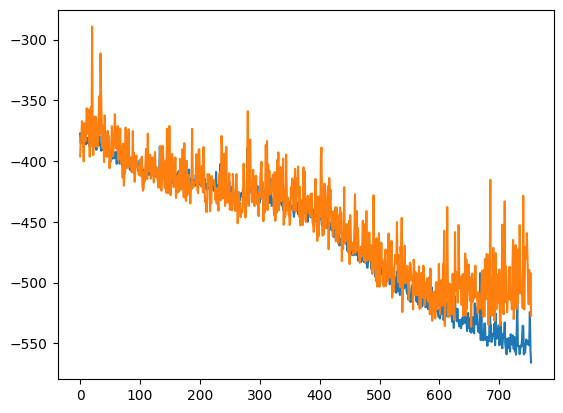

alpha 0.1 default_lr 0.0005


In [15]:
plt.plot(train_curve1)
plt.plot(valid_curve1)
plt.show()

# plt.plot(train_curve2)
# plt.plot(valid_curve2)
# plt.show()

# plt.plot(train_curve3)
# plt.plot(valid_curve3)
# plt.show()
print("alpha",alpha, "default_lr", default_lr)

In [16]:
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0d = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0e = copy.deepcopy(iwvi.simenv_rolloutdata)



0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56

実環境方策rollout vs Sim環境方策rollout


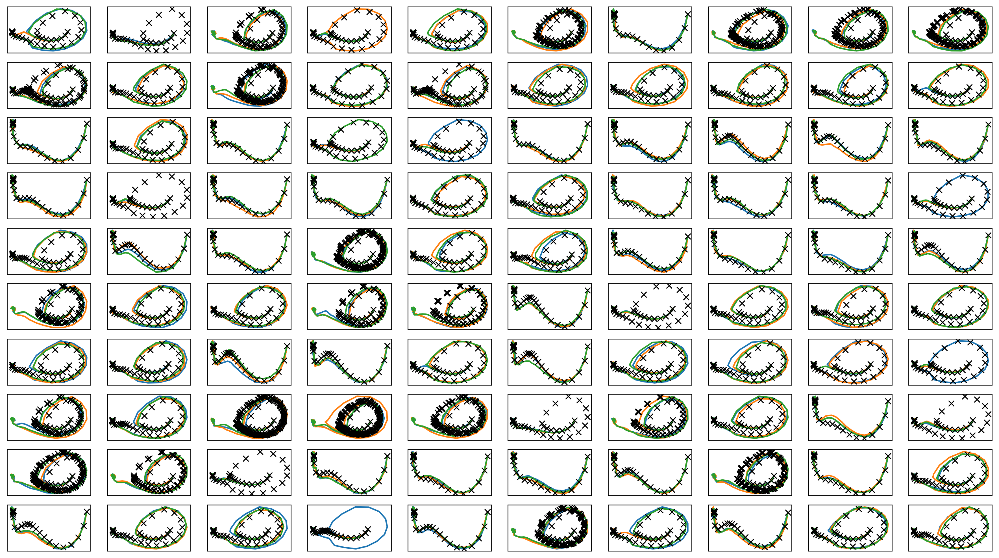

In [17]:
fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter1.png")
plt.savefig(figfilenamehead+"joint_iter1.eps")
# plt.savefig(figfilenamehead+"joint_iter1.pdf")
print("実環境方策rollout vs Sim環境方策rollout")

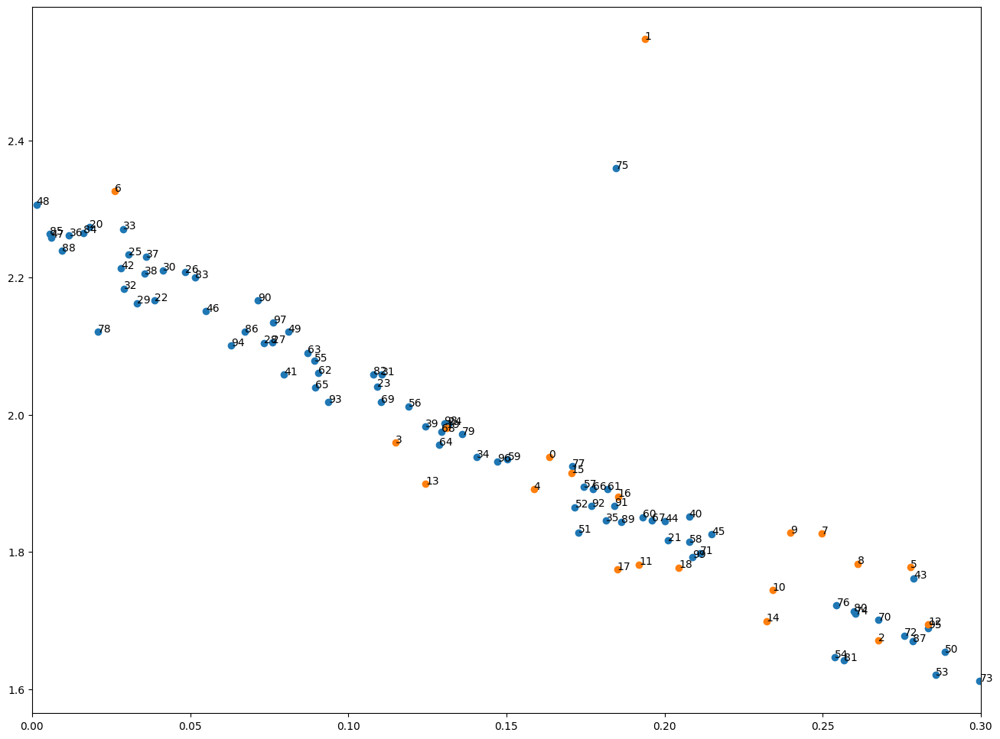

[0.16346495 0.19376823 0.2675319  0.11503246 0.15866848 0.27767899
 0.02613879 0.24978595 0.26100364 0.23974757]
[0.23415875 0.19197631 0.28340068 0.12439858 0.23227011 0.17053018
 0.18529065 0.1850802  0.20454609 0.13110959]
[0.01806764 0.20119136 0.03867789 0.10911323 0.13158045 0.03061344
 0.04839286 0.07598748 0.07332768 0.03311254]
[0.04145489 0.11061755 0.02913038 0.02882952 0.14059536 0.18145366
 0.01175634 0.03605897 0.03561832 0.1242789 ]
[0.20774164 0.07961685 0.02818215 0.27878886 0.20022311 0.21489816
 0.05495741 0.00603226 0.00140864 0.08100239]
[0.28865656 0.1728472  0.17167557 0.2858247  0.2539226  0.08923109
 0.11895172 0.17438186 0.20775948 0.15039731]
[0.19319706 0.18191796 0.09047245 0.08702328 0.12863061 0.0894847
 0.17726183 0.19596025 0.12942553 0.11026856]
[0.26757701 0.21116658 0.27584478 0.2996541  0.26043782 0.18466787
 0.25440247 0.17073022 0.0207501  0.1360628 ]
[0.2599147  0.256741   0.10799342 0.0514889  0.0163014  0.00555654
 0.06717741 0.27842439 0.00955

In [18]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter1.png")
plt.savefig(figfilenamehead+"damping_latent_iter1.eps")
# plt.savefig(figfilenamehead+"damping_latent_iter1.pdf")
plt.show()



for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [19]:
print(datetime.datetime.now())

2023-06-10 07:18:36.397448


# Iter2

In [20]:
iwvi.get_sim_rollout_mdppolicy_data_randomstop()

0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   


In [21]:
iwvi.train_ratio(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, policy=agent.select_action)


train: iter 0  trainloss 0.22883  validloss 0.37572±0.00000  bestvalidloss 0.37572  last_update 0
train: iter 1  trainloss 0.20411  validloss 0.21282±0.00000  bestvalidloss 0.21282  last_update 0
train: iter 2  trainloss 0.20151  validloss 0.20073±0.00000  bestvalidloss 0.20073  last_update 0
train: iter 3  trainloss 0.19369  validloss 0.19440±0.00000  bestvalidloss 0.19440  last_update 0
train: iter 4  trainloss 0.19510  validloss 0.19705±0.00000  bestvalidloss 0.19440  last_update 1
train: iter 5  trainloss 0.19127  validloss 0.18967±0.00000  bestvalidloss 0.18967  last_update 0
train: iter 6  trainloss 0.19076  validloss 0.18931±0.00000  bestvalidloss 0.18931  last_update 0
train: iter 7  trainloss 0.18746  validloss 0.17967±0.00000  bestvalidloss 0.17967  last_update 0
train: iter 8  trainloss 0.18636  validloss 0.18168±0.00000  bestvalidloss 0.17967  last_update 1
train: iter 9  trainloss 0.18789  validloss 0.18868±0.00000  bestvalidloss 0.17967  last_update 2
train: iter 10  trai

train: iter 83  trainloss 0.16705  validloss 0.15988±0.00000  bestvalidloss 0.15451  last_update 6
train: iter 84  trainloss 0.16614  validloss 0.16321±0.00000  bestvalidloss 0.15451  last_update 7
train: iter 85  trainloss 0.16926  validloss 0.16454±0.00000  bestvalidloss 0.15451  last_update 8
train: iter 86  trainloss 0.16771  validloss 0.15811±0.00000  bestvalidloss 0.15451  last_update 9
train: iter 87  trainloss 0.16615  validloss 0.15971±0.00000  bestvalidloss 0.15451  last_update 10
train: iter 88  trainloss 0.16951  validloss 0.15553±0.00000  bestvalidloss 0.15451  last_update 11
train: iter 89  trainloss 0.16757  validloss 0.16099±0.00000  bestvalidloss 0.15451  last_update 12
train: iter 90  trainloss 0.16828  validloss 0.16301±0.00000  bestvalidloss 0.15451  last_update 13
train: iter 91  trainloss 0.16613  validloss 0.15882±0.00000  bestvalidloss 0.15451  last_update 14
train: iter 92  trainloss 0.16909  validloss 0.16386±0.00000  bestvalidloss 0.15451  last_update 15
trai

train: iter 165  trainloss 0.16237  validloss 0.16324±0.00000  bestvalidloss 0.15233  last_update 4
train: iter 166  trainloss 0.16351  validloss 0.15401±0.00000  bestvalidloss 0.15233  last_update 5
train: iter 167  trainloss 0.16372  validloss 0.15137±0.00000  bestvalidloss 0.15137  last_update 0
train: iter 168  trainloss 0.16295  validloss 0.15052±0.00000  bestvalidloss 0.15052  last_update 0
train: iter 169  trainloss 0.16089  validloss 0.15451±0.00000  bestvalidloss 0.15052  last_update 1
train: iter 170  trainloss 0.16049  validloss 0.15290±0.00000  bestvalidloss 0.15052  last_update 2
train: iter 171  trainloss 0.16098  validloss 0.15658±0.00000  bestvalidloss 0.15052  last_update 3
train: iter 172  trainloss 0.16113  validloss 0.15321±0.00000  bestvalidloss 0.15052  last_update 4
train: iter 173  trainloss 0.16035  validloss 0.15903±0.00000  bestvalidloss 0.15052  last_update 5
train: iter 174  trainloss 0.16172  validloss 0.16153±0.00000  bestvalidloss 0.15052  last_update 6


train: iter 247  trainloss 0.15692  validloss 0.15086±0.00000  bestvalidloss 0.14499  last_update 7
train: iter 248  trainloss 0.15914  validloss 0.15710±0.00000  bestvalidloss 0.14499  last_update 8
train: iter 249  trainloss 0.15698  validloss 0.14831±0.00000  bestvalidloss 0.14499  last_update 9
train: iter 250  trainloss 0.15662  validloss 0.14639±0.00000  bestvalidloss 0.14499  last_update 10
train: iter 251  trainloss 0.15788  validloss 0.15061±0.00000  bestvalidloss 0.14499  last_update 11
train: iter 252  trainloss 0.15643  validloss 0.15385±0.00000  bestvalidloss 0.14499  last_update 12
train: iter 253  trainloss 0.15775  validloss 0.14751±0.00000  bestvalidloss 0.14499  last_update 13
train: iter 254  trainloss 0.15604  validloss 0.15338±0.00000  bestvalidloss 0.14499  last_update 14
train: iter 255  trainloss 0.15683  validloss 0.15224±0.00000  bestvalidloss 0.14499  last_update 15
train: iter 256  trainloss 0.15650  validloss 0.14515±0.00000  bestvalidloss 0.14499  last_upd

train: iter 329  trainloss 0.15510  validloss 0.14652±0.00000  bestvalidloss 0.14288  last_update 7
train: iter 330  trainloss 0.15233  validloss 0.14859±0.00000  bestvalidloss 0.14288  last_update 8
train: iter 331  trainloss 0.15382  validloss 0.16238±0.00000  bestvalidloss 0.14288  last_update 9
train: iter 332  trainloss 0.15345  validloss 0.14683±0.00000  bestvalidloss 0.14288  last_update 10
train: iter 333  trainloss 0.15320  validloss 0.15509±0.00000  bestvalidloss 0.14288  last_update 11
train: iter 334  trainloss 0.15305  validloss 0.14699±0.00000  bestvalidloss 0.14288  last_update 12
train: iter 335  trainloss 0.15401  validloss 0.15432±0.00000  bestvalidloss 0.14288  last_update 13
train: iter 336  trainloss 0.15495  validloss 0.14840±0.00000  bestvalidloss 0.14288  last_update 14
train: iter 337  trainloss 0.15115  validloss 0.14641±0.00000  bestvalidloss 0.14288  last_update 15
train: iter 338  trainloss 0.15390  validloss 0.16124±0.00000  bestvalidloss 0.14288  last_upd

train: iter 411  trainloss 0.15087  validloss 0.14328±0.00000  bestvalidloss 0.14171  last_update 47
train: iter 412  trainloss 0.15041  validloss 0.14679±0.00000  bestvalidloss 0.14171  last_update 48
train: iter 413  trainloss 0.15001  validloss 0.14718±0.00000  bestvalidloss 0.14171  last_update 49
train: iter 414  trainloss 0.15405  validloss 0.14411±0.00000  bestvalidloss 0.14171  last_update 50
train: iter 415  trainloss 0.14952  validloss 0.14358±0.00000  bestvalidloss 0.14171  last_update 51
train: iter 416  trainloss 0.15356  validloss 0.14423±0.00000  bestvalidloss 0.14171  last_update 52
train: iter 417  trainloss 0.15132  validloss 0.14428±0.00000  bestvalidloss 0.14171  last_update 53
train: iter 418  trainloss 0.15188  validloss 0.14866±0.00000  bestvalidloss 0.14171  last_update 54
train: iter 419  trainloss 0.15146  validloss 0.14371±0.00000  bestvalidloss 0.14171  last_update 55
train: iter 420  trainloss 0.15077  validloss 0.14421±0.00000  bestvalidloss 0.14171  last_

train: iter 493  trainloss 0.14763  validloss 0.14580±0.00000  bestvalidloss 0.13820  last_update 7
train: iter 494  trainloss 0.14687  validloss 0.14400±0.00000  bestvalidloss 0.13820  last_update 8
train: iter 495  trainloss 0.14791  validloss 0.14357±0.00000  bestvalidloss 0.13820  last_update 9
train: iter 496  trainloss 0.14941  validloss 0.15287±0.00000  bestvalidloss 0.13820  last_update 10
train: iter 497  trainloss 0.14636  validloss 0.14057±0.00000  bestvalidloss 0.13820  last_update 11
train: iter 498  trainloss 0.14984  validloss 0.14207±0.00000  bestvalidloss 0.13820  last_update 12
train: iter 499  trainloss 0.14786  validloss 0.15234±0.00000  bestvalidloss 0.13820  last_update 13
train: iter 500  trainloss 0.14716  validloss 0.14125±0.00000  bestvalidloss 0.13820  last_update 14
train: iter 501  trainloss 0.14626  validloss 0.14209±0.00000  bestvalidloss 0.13820  last_update 15
train: iter 502  trainloss 0.14892  validloss 0.13784±0.00000  bestvalidloss 0.13784  last_upd

train: iter 575  trainloss 0.14603  validloss 0.14528±0.00000  bestvalidloss 0.13550  last_update 21
train: iter 576  trainloss 0.14545  validloss 0.15049±0.00000  bestvalidloss 0.13550  last_update 22
train: iter 577  trainloss 0.14502  validloss 0.13650±0.00000  bestvalidloss 0.13550  last_update 23
train: iter 578  trainloss 0.14608  validloss 0.14535±0.00000  bestvalidloss 0.13550  last_update 24
train: iter 579  trainloss 0.14697  validloss 0.13909±0.00000  bestvalidloss 0.13550  last_update 25
train: iter 580  trainloss 0.14750  validloss 0.14057±0.00000  bestvalidloss 0.13550  last_update 26
train: iter 581  trainloss 0.14568  validloss 0.13633±0.00000  bestvalidloss 0.13550  last_update 27
train: iter 582  trainloss 0.14825  validloss 0.14524±0.00000  bestvalidloss 0.13550  last_update 28
train: iter 583  trainloss 0.14754  validloss 0.14574±0.00000  bestvalidloss 0.13550  last_update 29
train: iter 584  trainloss 0.14822  validloss 0.13880±0.00000  bestvalidloss 0.13550  last_

train: iter 657  trainloss 0.14355  validloss 0.14425±0.00000  bestvalidloss 0.13283  last_update 33
train: iter 658  trainloss 0.14288  validloss 0.13666±0.00000  bestvalidloss 0.13283  last_update 34
train: iter 659  trainloss 0.14429  validloss 0.13724±0.00000  bestvalidloss 0.13283  last_update 35
train: iter 660  trainloss 0.14548  validloss 0.13379±0.00000  bestvalidloss 0.13283  last_update 36
train: iter 661  trainloss 0.14359  validloss 0.14303±0.00000  bestvalidloss 0.13283  last_update 37
train: iter 662  trainloss 0.14416  validloss 0.14228±0.00000  bestvalidloss 0.13283  last_update 38
train: iter 663  trainloss 0.14348  validloss 0.13807±0.00000  bestvalidloss 0.13283  last_update 39
train: iter 664  trainloss 0.14612  validloss 0.13464±0.00000  bestvalidloss 0.13283  last_update 40
train: iter 665  trainloss 0.14429  validloss 0.14282±0.00000  bestvalidloss 0.13283  last_update 41
train: iter 666  trainloss 0.14414  validloss 0.13802±0.00000  bestvalidloss 0.13283  last_

train: iter 739  trainloss 0.14208  validloss 0.13558±0.00000  bestvalidloss 0.13205  last_update 56
train: iter 740  trainloss 0.14364  validloss 0.13278±0.00000  bestvalidloss 0.13205  last_update 57
train: iter 741  trainloss 0.14221  validloss 0.13915±0.00000  bestvalidloss 0.13205  last_update 58
train: iter 742  trainloss 0.14359  validloss 0.14801±0.00000  bestvalidloss 0.13205  last_update 59
train: iter 743  trainloss 0.14244  validloss 0.13464±0.00000  bestvalidloss 0.13205  last_update 60
train: iter 744  trainloss 0.14185  validloss 0.14015±0.00000  bestvalidloss 0.13205  last_update 61
train: iter 745  trainloss 0.14168  validloss 0.15178±0.00000  bestvalidloss 0.13205  last_update 62
train: iter 746  trainloss 0.14265  validloss 0.14004±0.00000  bestvalidloss 0.13205  last_update 63
train: iter 747  trainloss 0.14413  validloss 0.14647±0.00000  bestvalidloss 0.13205  last_update 64
train: iter 748  trainloss 0.14237  validloss 0.14037±0.00000  bestvalidloss 0.13205  last_

([0.22882551345974206,
  0.20411078268662095,
  0.2015128979459405,
  0.19368906691670418,
  0.19510279102250933,
  0.19127426501363515,
  0.19076427035033702,
  0.18746410887688397,
  0.18635550821200014,
  0.18789232010021806,
  0.18696425585076212,
  0.18602297706529497,
  0.185307923797518,
  0.18289246335625647,
  0.18250080598518253,
  0.1809616063721478,
  0.1828740792348981,
  0.1833292840048671,
  0.18154175393283367,
  0.18102004881948233,
  0.1807331365533173,
  0.17907542204484345,
  0.17938229190185667,
  0.17941203908994793,
  0.17692439202219248,
  0.17940296567976474,
  0.17628224538639187,
  0.1770226089283824,
  0.17622336158528923,
  0.17762940246611833,
  0.18042688136920332,
  0.17712968615815045,
  0.17410204391926526,
  0.17523027043789624,
  0.17452991362661124,
  0.174672731757164,
  0.17570696966722607,
  0.1748502385802567,
  0.17364822495728732,
  0.17260683756321668,
  0.172027859184891,
  0.17346307458356022,
  0.17440407127141952,
  0.17323701418936252,
 

In [22]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))
# print(loss_list)
# print(normalized_loss_list)

train_loss:  -0.5925559950321915
valid_loss:  -0.36052353542447096
weight_alpha 1.0 h_min_tilde -6.1621194 ell_tilde -0.5461495031106474 kappa_tilde 0.00042197586766147283
train_loss:  -2.04109000402689
valid_loss:  -1.6045772804260257
weight_alpha 0.1 h_min_tilde -6.1621194 ell_tilde -1.953787459306717 kappa_tilde 0.00048746675954014615


1e-08 1000.0


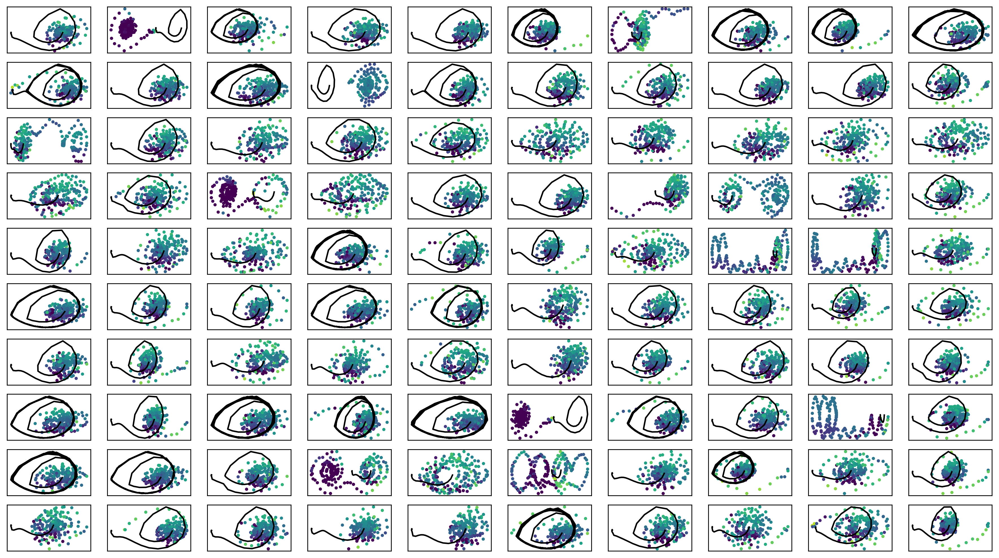

In [23]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter2.png")

In [24]:

train_curve1, valid_curve1 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()

# train_curve2, valid_curve2 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=2)
# iwvi.update_mulogvar_offlinedata()

# train_curve3, valid_curve3 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=3)
# iwvi.update_mulogvar_offlinedata()



weight_alpha 0.1
train_weighted_vae: enc_dec
train: iter 0  trainloss -400.52168  validloss -317.96821±0.00000  bestvalidloss -317.96821  last_update 0
train: iter 1  trainloss -402.94910  validloss -361.12342±0.00000  bestvalidloss -361.12342  last_update 0
train: iter 2  trainloss -409.20546  validloss -330.66769±0.00000  bestvalidloss -361.12342  last_update 1
train: iter 3  trainloss -406.72187  validloss -307.58089±0.00000  bestvalidloss -361.12342  last_update 2
train: iter 4  trainloss -412.75544  validloss -351.61498±0.00000  bestvalidloss -361.12342  last_update 3
train: iter 5  trainloss -402.89916  validloss -289.09205±0.00000  bestvalidloss -361.12342  last_update 4
train: iter 6  trainloss -402.28635  validloss -300.98205±0.00000  bestvalidloss -361.12342  last_update 5
train: iter 7  trainloss -403.53577  validloss -349.12843±0.00000  bestvalidloss -361.12342  last_update 6
train: iter 8  trainloss -398.30628  validloss -193.94842±0.00000  bestvalidloss -361.12342  last_u

train: iter 76  trainloss -422.91154  validloss -334.46707±0.00000  bestvalidloss -369.86466  last_update 44
train: iter 77  trainloss -412.75187  validloss -321.67584±0.00000  bestvalidloss -369.86466  last_update 45
train: iter 78  trainloss -412.72026  validloss -314.57906±0.00000  bestvalidloss -369.86466  last_update 46
train: iter 79  trainloss -416.33104  validloss -351.73146±0.00000  bestvalidloss -369.86466  last_update 47
train: iter 80  trainloss -424.28092  validloss -339.30616±0.00000  bestvalidloss -369.86466  last_update 48
train: iter 81  trainloss -423.07315  validloss -319.14450±0.00000  bestvalidloss -369.86466  last_update 49
train: iter 82  trainloss -411.35110  validloss -314.46488±0.00000  bestvalidloss -369.86466  last_update 50
train: iter 83  trainloss -409.01724  validloss -366.82430±0.00000  bestvalidloss -369.86466  last_update 51
train: iter 84  trainloss -413.55938  validloss -308.03440±0.00000  bestvalidloss -369.86466  last_update 52
train: iter 85  tra

train: iter 151  trainloss -417.87868  validloss -302.93848±0.00000  bestvalidloss -374.18480  last_update 15
train: iter 152  trainloss -417.68355  validloss -291.64215±0.00000  bestvalidloss -374.18480  last_update 16
train: iter 153  trainloss -420.27466  validloss -374.06525±0.00000  bestvalidloss -374.18480  last_update 17
train: iter 154  trainloss -411.09904  validloss -255.73841±0.00000  bestvalidloss -374.18480  last_update 18
train: iter 155  trainloss -415.89906  validloss -317.08797±0.00000  bestvalidloss -374.18480  last_update 19
train: iter 156  trainloss -420.35842  validloss -328.64967±0.00000  bestvalidloss -374.18480  last_update 20
train: iter 157  trainloss -419.50728  validloss -356.16237±0.00000  bestvalidloss -374.18480  last_update 21
train: iter 158  trainloss -417.35416  validloss -328.21910±0.00000  bestvalidloss -374.18480  last_update 22
train: iter 159  trainloss -416.87166  validloss -296.93217±0.00000  bestvalidloss -374.18480  last_update 23
train: ite

train: iter 226  trainloss -422.34590  validloss -312.29809±0.00000  bestvalidloss -375.95613  last_update 59
train: iter 227  trainloss -410.11319  validloss -366.93933±0.00000  bestvalidloss -375.95613  last_update 60
train: iter 228  trainloss -418.02957  validloss -344.55908±0.00000  bestvalidloss -375.95613  last_update 61
train: iter 229  trainloss -422.92185  validloss -311.31911±0.00000  bestvalidloss -375.95613  last_update 62
train: iter 230  trainloss -418.09942  validloss -321.41632±0.00000  bestvalidloss -375.95613  last_update 63
train: iter 231  trainloss -425.80538  validloss -341.20584±0.00000  bestvalidloss -375.95613  last_update 64
train: iter 232  trainloss -418.88392  validloss -350.19905±0.00000  bestvalidloss -375.95613  last_update 65
train: iter 233  trainloss -414.92874  validloss -332.63098±0.00000  bestvalidloss -375.95613  last_update 66
train: iter 234  trainloss -430.57169  validloss -367.31812±0.00000  bestvalidloss -375.95613  last_update 67
train: ite

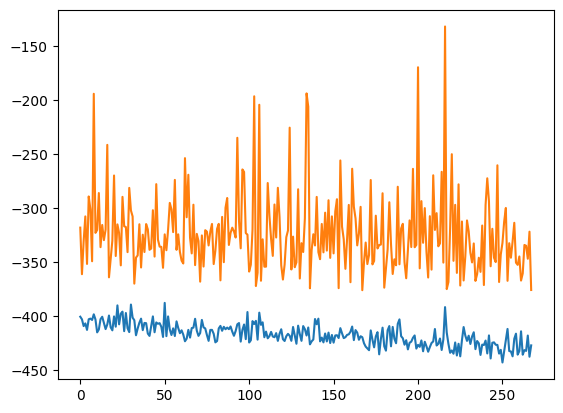

alpha 0.1 default_lr 0.0005


In [25]:
plt.plot(train_curve1)
plt.plot(valid_curve1)
plt.show()

# plt.plot(train_curve2)
# plt.plot(valid_curve2)
# plt.show()

# plt.plot(train_curve3)
# plt.plot(valid_curve3)
# plt.show()
print("alpha",alpha, "default_lr", default_lr)

In [26]:
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)



0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56

実環境方策rollout vs Sim環境方策rollout


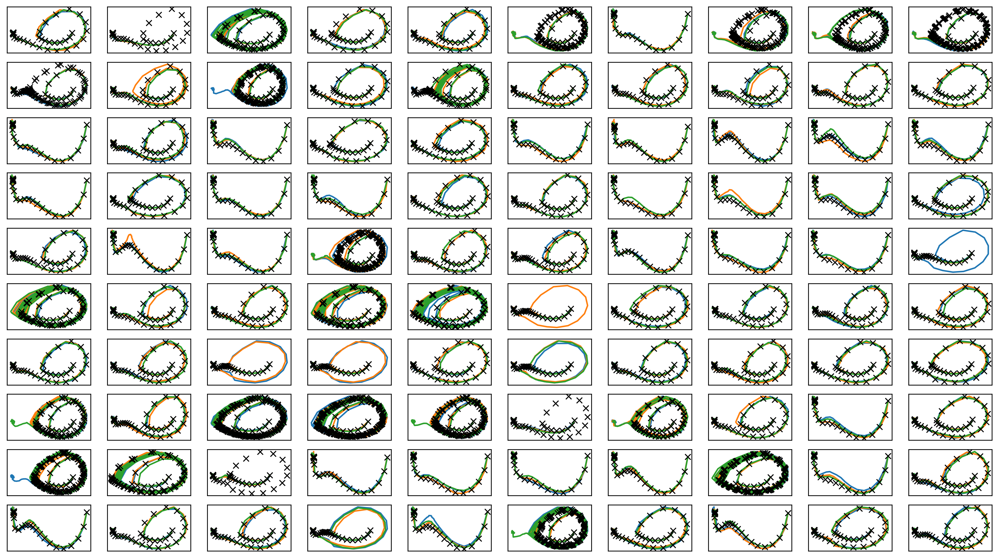

In [27]:
fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter2.png")
plt.savefig(figfilenamehead+"joint_iter2.eps")
# plt.savefig(figfilenamehead+"joint_iter2.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

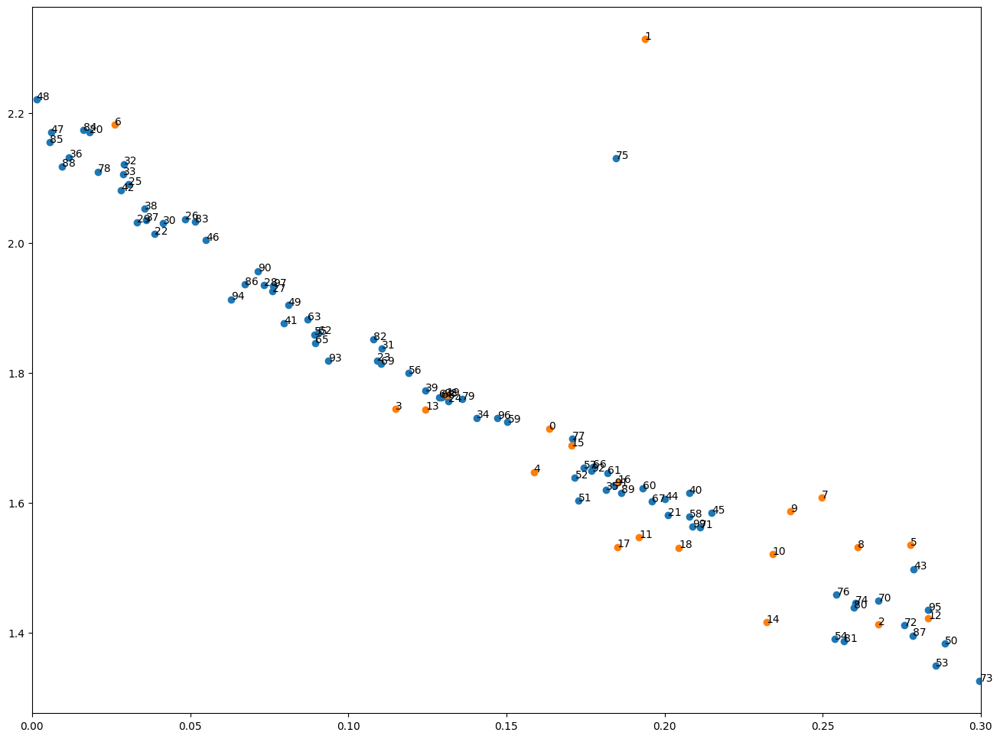

[0.16346495 0.19376823 0.2675319  0.11503246 0.15866848 0.27767899
 0.02613879 0.24978595 0.26100364 0.23974757]
[0.23415875 0.19197631 0.28340068 0.12439858 0.23227011 0.17053018
 0.18529065 0.1850802  0.20454609 0.13110959]
[0.01806764 0.20119136 0.03867789 0.10911323 0.13158045 0.03061344
 0.04839286 0.07598748 0.07332768 0.03311254]
[0.04145489 0.11061755 0.02913038 0.02882952 0.14059536 0.18145366
 0.01175634 0.03605897 0.03561832 0.1242789 ]
[0.20774164 0.07961685 0.02818215 0.27878886 0.20022311 0.21489816
 0.05495741 0.00603226 0.00140864 0.08100239]
[0.28865656 0.1728472  0.17167557 0.2858247  0.2539226  0.08923109
 0.11895172 0.17438186 0.20775948 0.15039731]
[0.19319706 0.18191796 0.09047245 0.08702328 0.12863061 0.0894847
 0.17726183 0.19596025 0.12942553 0.11026856]
[0.26757701 0.21116658 0.27584478 0.2996541  0.26043782 0.18466787
 0.25440247 0.17073022 0.0207501  0.1360628 ]
[0.2599147  0.256741   0.10799342 0.0514889  0.0163014  0.00555654
 0.06717741 0.27842439 0.00955

In [28]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter2.png")
plt.savefig(figfilenamehead+"damping_latent_iter2.eps")
# plt.savefig(figfilenamehead+"damping_latent_iter2.pdf")
plt.show()



for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [29]:
print(datetime.datetime.now())

2023-06-10 07:23:22.491537


# Iter 3

In [30]:
iwvi.get_sim_rollout_mdppolicy_data_randomstop()

0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   


In [31]:
iwvi.train_ratio(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, policy=agent.select_action)


train: iter 0  trainloss 0.15836  validloss 0.14744±0.00000  bestvalidloss 0.14744  last_update 0
train: iter 1  trainloss 0.15628  validloss 0.15249±0.00000  bestvalidloss 0.14744  last_update 1
train: iter 2  trainloss 0.15561  validloss 0.14703±0.00000  bestvalidloss 0.14703  last_update 0
train: iter 3  trainloss 0.15090  validloss 0.13551±0.00000  bestvalidloss 0.13551  last_update 0
train: iter 4  trainloss 0.15096  validloss 0.14249±0.00000  bestvalidloss 0.13551  last_update 1
train: iter 5  trainloss 0.15358  validloss 0.13716±0.00000  bestvalidloss 0.13551  last_update 2
train: iter 6  trainloss 0.15151  validloss 0.14622±0.00000  bestvalidloss 0.13551  last_update 3
train: iter 7  trainloss 0.15112  validloss 0.13942±0.00000  bestvalidloss 0.13551  last_update 4
train: iter 8  trainloss 0.15227  validloss 0.13291±0.00000  bestvalidloss 0.13291  last_update 0
train: iter 9  trainloss 0.14964  validloss 0.13391±0.00000  bestvalidloss 0.13291  last_update 1
train: iter 10  trai

train: iter 83  trainloss 0.14404  validloss 0.14119±0.00000  bestvalidloss 0.12770  last_update 16
train: iter 84  trainloss 0.14624  validloss 0.13802±0.00000  bestvalidloss 0.12770  last_update 17
train: iter 85  trainloss 0.14545  validloss 0.13495±0.00000  bestvalidloss 0.12770  last_update 18
train: iter 86  trainloss 0.14625  validloss 0.13387±0.00000  bestvalidloss 0.12770  last_update 19
train: iter 87  trainloss 0.14489  validloss 0.12820±0.00000  bestvalidloss 0.12770  last_update 20
train: iter 88  trainloss 0.14500  validloss 0.13444±0.00000  bestvalidloss 0.12770  last_update 21
train: iter 89  trainloss 0.14546  validloss 0.13633±0.00000  bestvalidloss 0.12770  last_update 22
train: iter 90  trainloss 0.14490  validloss 0.13130±0.00000  bestvalidloss 0.12770  last_update 23
train: iter 91  trainloss 0.14507  validloss 0.13063±0.00000  bestvalidloss 0.12770  last_update 24
train: iter 92  trainloss 0.14677  validloss 0.12754±0.00000  bestvalidloss 0.12754  last_update 0
t

train: iter 165  trainloss 0.14369  validloss 0.13501±0.00000  bestvalidloss 0.12517  last_update 15
train: iter 166  trainloss 0.14180  validloss 0.12788±0.00000  bestvalidloss 0.12517  last_update 16
train: iter 167  trainloss 0.14492  validloss 0.12934±0.00000  bestvalidloss 0.12517  last_update 17
train: iter 168  trainloss 0.14339  validloss 0.12710±0.00000  bestvalidloss 0.12517  last_update 18
train: iter 169  trainloss 0.14201  validloss 0.12621±0.00000  bestvalidloss 0.12517  last_update 19
train: iter 170  trainloss 0.14155  validloss 0.12755±0.00000  bestvalidloss 0.12517  last_update 20
train: iter 171  trainloss 0.14152  validloss 0.13388±0.00000  bestvalidloss 0.12517  last_update 21
train: iter 172  trainloss 0.14241  validloss 0.12901±0.00000  bestvalidloss 0.12517  last_update 22
train: iter 173  trainloss 0.14176  validloss 0.13416±0.00000  bestvalidloss 0.12517  last_update 23
train: iter 174  trainloss 0.14247  validloss 0.13267±0.00000  bestvalidloss 0.12517  last_

train: iter 247  trainloss 0.14048  validloss 0.12922±0.00000  bestvalidloss 0.12346  last_update 15
train: iter 248  trainloss 0.13930  validloss 0.12730±0.00000  bestvalidloss 0.12346  last_update 16
train: iter 249  trainloss 0.14429  validloss 0.12913±0.00000  bestvalidloss 0.12346  last_update 17
train: iter 250  trainloss 0.14075  validloss 0.13203±0.00000  bestvalidloss 0.12346  last_update 18
train: iter 251  trainloss 0.13979  validloss 0.13353±0.00000  bestvalidloss 0.12346  last_update 19
train: iter 252  trainloss 0.13970  validloss 0.13078±0.00000  bestvalidloss 0.12346  last_update 20
train: iter 253  trainloss 0.13917  validloss 0.12356±0.00000  bestvalidloss 0.12346  last_update 21
train: iter 254  trainloss 0.13918  validloss 0.13087±0.00000  bestvalidloss 0.12346  last_update 22
train: iter 255  trainloss 0.13944  validloss 0.12376±0.00000  bestvalidloss 0.12346  last_update 23
train: iter 256  trainloss 0.13957  validloss 0.13203±0.00000  bestvalidloss 0.12346  last_

train: iter 329  trainloss 0.13834  validloss 0.12250±0.00000  bestvalidloss 0.12182  last_update 2
train: iter 330  trainloss 0.13748  validloss 0.12142±0.00000  bestvalidloss 0.12142  last_update 0
train: iter 331  trainloss 0.13828  validloss 0.13261±0.00000  bestvalidloss 0.12142  last_update 1
train: iter 332  trainloss 0.13835  validloss 0.12371±0.00000  bestvalidloss 0.12142  last_update 2
train: iter 333  trainloss 0.13972  validloss 0.12569±0.00000  bestvalidloss 0.12142  last_update 3
train: iter 334  trainloss 0.13801  validloss 0.13376±0.00000  bestvalidloss 0.12142  last_update 4
train: iter 335  trainloss 0.14035  validloss 0.13230±0.00000  bestvalidloss 0.12142  last_update 5
train: iter 336  trainloss 0.13826  validloss 0.12394±0.00000  bestvalidloss 0.12142  last_update 6
train: iter 337  trainloss 0.13746  validloss 0.12473±0.00000  bestvalidloss 0.12142  last_update 7
train: iter 338  trainloss 0.13886  validloss 0.12815±0.00000  bestvalidloss 0.12142  last_update 8


train: iter 411  trainloss 0.13542  validloss 0.12754±0.00000  bestvalidloss 0.11960  last_update 22
train: iter 412  trainloss 0.13666  validloss 0.12360±0.00000  bestvalidloss 0.11960  last_update 23
train: iter 413  trainloss 0.13651  validloss 0.13078±0.00000  bestvalidloss 0.11960  last_update 24
train: iter 414  trainloss 0.13779  validloss 0.12853±0.00000  bestvalidloss 0.11960  last_update 25
train: iter 415  trainloss 0.13844  validloss 0.12325±0.00000  bestvalidloss 0.11960  last_update 26
train: iter 416  trainloss 0.13512  validloss 0.12438±0.00000  bestvalidloss 0.11960  last_update 27
train: iter 417  trainloss 0.13569  validloss 0.12896±0.00000  bestvalidloss 0.11960  last_update 28
train: iter 418  trainloss 0.13494  validloss 0.12288±0.00000  bestvalidloss 0.11960  last_update 29
train: iter 419  trainloss 0.13708  validloss 0.12867±0.00000  bestvalidloss 0.11960  last_update 30
train: iter 420  trainloss 0.13665  validloss 0.12810±0.00000  bestvalidloss 0.11960  last_

train: iter 493  trainloss 0.13517  validloss 0.12844±0.00000  bestvalidloss 0.11910  last_update 57
train: iter 494  trainloss 0.13338  validloss 0.12069±0.00000  bestvalidloss 0.11910  last_update 58
train: iter 495  trainloss 0.13550  validloss 0.12273±0.00000  bestvalidloss 0.11910  last_update 59
train: iter 496  trainloss 0.13483  validloss 0.12379±0.00000  bestvalidloss 0.11910  last_update 60
train: iter 497  trainloss 0.13442  validloss 0.12120±0.00000  bestvalidloss 0.11910  last_update 61
train: iter 498  trainloss 0.13519  validloss 0.13165±0.00000  bestvalidloss 0.11910  last_update 62
train: iter 499  trainloss 0.13420  validloss 0.13983±0.00000  bestvalidloss 0.11910  last_update 63
train: iter 500  trainloss 0.13478  validloss 0.11921±0.00000  bestvalidloss 0.11910  last_update 64
train: iter 501  trainloss 0.13542  validloss 0.12419±0.00000  bestvalidloss 0.11910  last_update 65
train: iter 502  trainloss 0.13416  validloss 0.12570±0.00000  bestvalidloss 0.11910  last_

train: iter 575  trainloss 0.13241  validloss 0.12358±0.00000  bestvalidloss 0.11784  last_update 46
train: iter 576  trainloss 0.13403  validloss 0.13086±0.00000  bestvalidloss 0.11784  last_update 47
train: iter 577  trainloss 0.13739  validloss 0.12023±0.00000  bestvalidloss 0.11784  last_update 48
train: iter 578  trainloss 0.13297  validloss 0.12537±0.00000  bestvalidloss 0.11784  last_update 49
train: iter 579  trainloss 0.13439  validloss 0.12445±0.00000  bestvalidloss 0.11784  last_update 50
train: iter 580  trainloss 0.13275  validloss 0.12111±0.00000  bestvalidloss 0.11784  last_update 51
train: iter 581  trainloss 0.13440  validloss 0.12187±0.00000  bestvalidloss 0.11784  last_update 52
train: iter 582  trainloss 0.13346  validloss 0.12627±0.00000  bestvalidloss 0.11784  last_update 53
train: iter 583  trainloss 0.13416  validloss 0.12628±0.00000  bestvalidloss 0.11784  last_update 54
train: iter 584  trainloss 0.13465  validloss 0.13646±0.00000  bestvalidloss 0.11784  last_

([0.1583643328398466,
  0.15627807863056659,
  0.1556077235378325,
  0.1509038034826517,
  0.1509587344713509,
  0.15358014339581133,
  0.15150872762314976,
  0.15112251015380024,
  0.15226908214390278,
  0.1496442173141986,
  0.14949364280328153,
  0.14964759121648968,
  0.1502765421755612,
  0.1495938090607524,
  0.149158223439008,
  0.1492256131954491,
  0.14889540914446114,
  0.1507054781075567,
  0.14982545939274133,
  0.14920502780005335,
  0.151323760766536,
  0.15002343691885472,
  0.15085804942063988,
  0.15052261776290835,
  0.1482883498072624,
  0.1474905971903354,
  0.14913322497159243,
  0.15094256410375237,
  0.14938474958762527,
  0.14794617062434554,
  0.14797137323766946,
  0.1473340260796249,
  0.1489559644833207,
  0.14881195165216923,
  0.14940715515986086,
  0.14978087567724288,
  0.14941082666628064,
  0.14880519518628715,
  0.14828965393826365,
  0.14720668462105096,
  0.14846791373565793,
  0.1482879851013422,
  0.14793343842029572,
  0.14675141391344368,
  0.14

In [32]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))
# print(loss_list)
# print(normalized_loss_list)

train_loss:  -0.7725477681487799
valid_loss:  -0.5931332044005394
weight_alpha 1.0 h_min_tilde -6.1621156 ell_tilde -0.7366648553991318 kappa_tilde 0.00042932095674369427
train_loss:  -2.1687742319107057
valid_loss:  -1.9138053537368773
weight_alpha 0.1 h_min_tilde -6.1621156 ell_tilde -2.1177804562759404 kappa_tilde 0.0004972518788417575


1e-08 1000.0


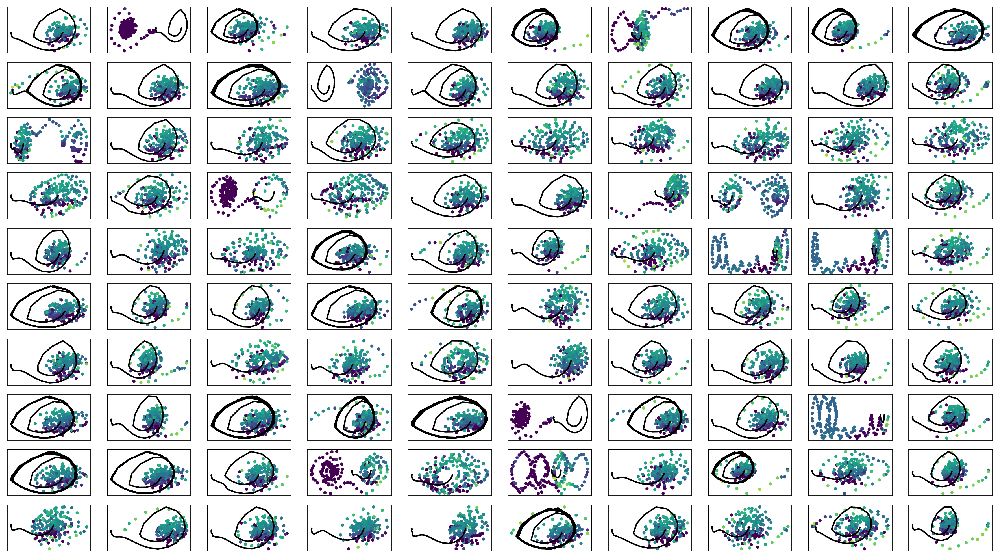

In [33]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter3.png")

In [34]:

train_curve1, valid_curve1 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()

# train_curve2, valid_curve2 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=2)
# iwvi.update_mulogvar_offlinedata()

# train_curve3, valid_curve3 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=3)
# iwvi.update_mulogvar_offlinedata()



weight_alpha 0.1
train_weighted_vae: enc_dec
train: iter 0  trainloss -434.23551  validloss -392.01776±0.00000  bestvalidloss -392.01776  last_update 0
train: iter 1  trainloss -437.66435  validloss -386.33604±0.00000  bestvalidloss -392.01776  last_update 1
train: iter 2  trainloss -433.90765  validloss -370.10485±0.00000  bestvalidloss -392.01776  last_update 2
train: iter 3  trainloss -427.24563  validloss -394.60890±0.00000  bestvalidloss -394.60890  last_update 0
train: iter 4  trainloss -435.39217  validloss -376.66234±0.00000  bestvalidloss -394.60890  last_update 1
train: iter 5  trainloss -430.07665  validloss -393.56765±0.00000  bestvalidloss -394.60890  last_update 2
train: iter 6  trainloss -439.25642  validloss -384.70360±0.00000  bestvalidloss -394.60890  last_update 3
train: iter 7  trainloss -436.27214  validloss -370.51038±0.00000  bestvalidloss -394.60890  last_update 4
train: iter 8  trainloss -445.39590  validloss -373.97255±0.00000  bestvalidloss -394.60890  last_u

train: iter 76  trainloss -431.65952  validloss -381.67669±0.00000  bestvalidloss -398.24351  last_update 30
train: iter 77  trainloss -431.61428  validloss -375.66899±0.00000  bestvalidloss -398.24351  last_update 31
train: iter 78  trainloss -433.79715  validloss -351.92067±0.00000  bestvalidloss -398.24351  last_update 32
train: iter 79  trainloss -416.02538  validloss -319.04113±0.00000  bestvalidloss -398.24351  last_update 33
train: iter 80  trainloss -442.49946  validloss -364.09838±0.00000  bestvalidloss -398.24351  last_update 34
train: iter 81  trainloss -447.79683  validloss -359.32948±0.00000  bestvalidloss -398.24351  last_update 35
train: iter 82  trainloss -427.28936  validloss -341.85437±0.00000  bestvalidloss -398.24351  last_update 36
train: iter 83  trainloss -434.02188  validloss -354.95631±0.00000  bestvalidloss -398.24351  last_update 37
train: iter 84  trainloss -433.59671  validloss -375.92715±0.00000  bestvalidloss -398.24351  last_update 38
train: iter 85  tra

train: iter 151  trainloss -422.99725  validloss -317.27900±0.00000  bestvalidloss -402.02469  last_update 51
train: iter 152  trainloss -443.50708  validloss -386.05964±0.00000  bestvalidloss -402.02469  last_update 52
train: iter 153  trainloss -435.18133  validloss -363.87365±0.00000  bestvalidloss -402.02469  last_update 53
train: iter 154  trainloss -446.44655  validloss -329.18151±0.00000  bestvalidloss -402.02469  last_update 54
train: iter 155  trainloss -448.71730  validloss -362.84114±0.00000  bestvalidloss -402.02469  last_update 55
train: iter 156  trainloss -444.61861  validloss -325.17180±0.00000  bestvalidloss -402.02469  last_update 56
train: iter 157  trainloss -448.12586  validloss -371.47333±0.00000  bestvalidloss -402.02469  last_update 57
train: iter 158  trainloss -451.90393  validloss -369.09809±0.00000  bestvalidloss -402.02469  last_update 58
train: iter 159  trainloss -441.26128  validloss -362.35343±0.00000  bestvalidloss -402.02469  last_update 59
train: ite

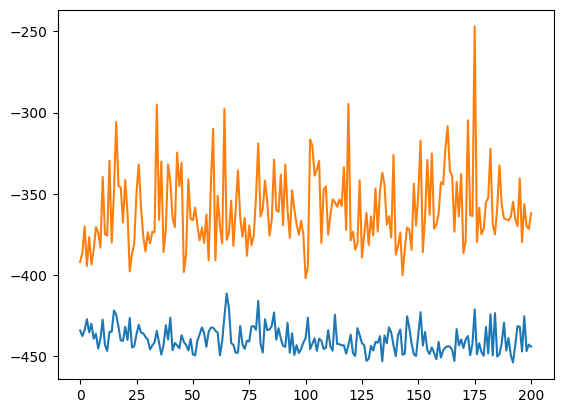

alpha 0.1 default_lr 0.0005


In [35]:
plt.plot(train_curve1)
plt.plot(valid_curve1)
plt.show()

# plt.plot(train_curve2)
# plt.plot(valid_curve2)
# plt.show()

# plt.plot(train_curve3)
# plt.plot(valid_curve3)
# plt.show()
print("alpha",alpha, "default_lr", default_lr)

In [36]:
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)


0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56

実環境方策rollout vs Sim環境方策rollout


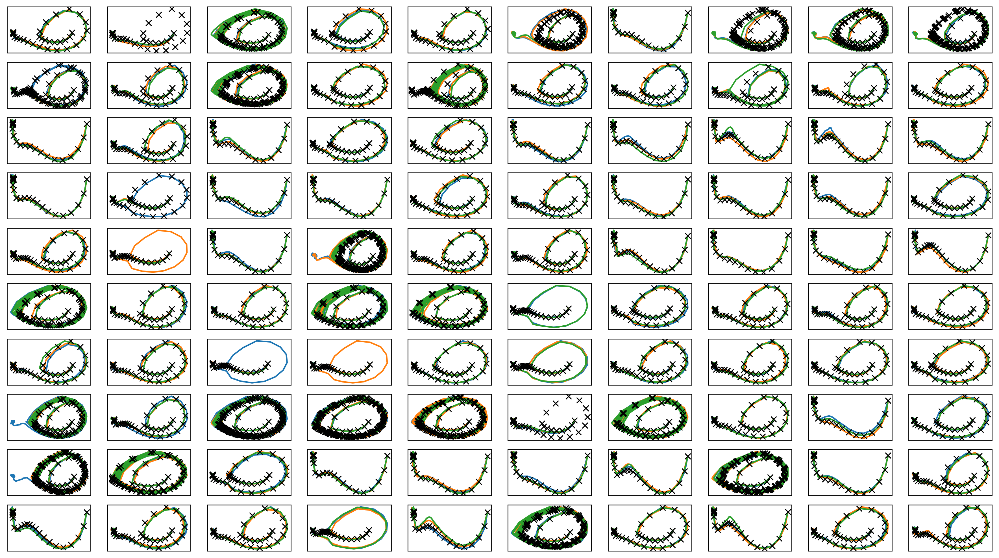

In [37]:

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter3.png")
plt.savefig(figfilenamehead+"joint_iter3.eps")
# plt.savefig(figfilenamehead+"joint_iter3.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

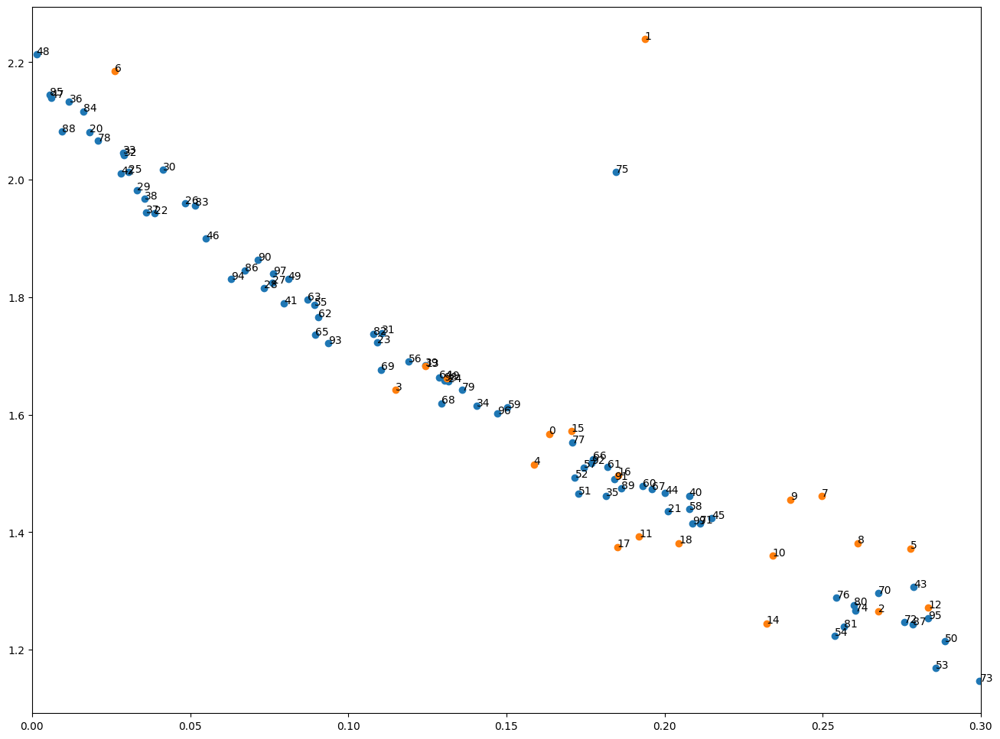

[0.16346495 0.19376823 0.2675319  0.11503246 0.15866848 0.27767899
 0.02613879 0.24978595 0.26100364 0.23974757]
[0.23415875 0.19197631 0.28340068 0.12439858 0.23227011 0.17053018
 0.18529065 0.1850802  0.20454609 0.13110959]
[0.01806764 0.20119136 0.03867789 0.10911323 0.13158045 0.03061344
 0.04839286 0.07598748 0.07332768 0.03311254]
[0.04145489 0.11061755 0.02913038 0.02882952 0.14059536 0.18145366
 0.01175634 0.03605897 0.03561832 0.1242789 ]
[0.20774164 0.07961685 0.02818215 0.27878886 0.20022311 0.21489816
 0.05495741 0.00603226 0.00140864 0.08100239]
[0.28865656 0.1728472  0.17167557 0.2858247  0.2539226  0.08923109
 0.11895172 0.17438186 0.20775948 0.15039731]
[0.19319706 0.18191796 0.09047245 0.08702328 0.12863061 0.0894847
 0.17726183 0.19596025 0.12942553 0.11026856]
[0.26757701 0.21116658 0.27584478 0.2996541  0.26043782 0.18466787
 0.25440247 0.17073022 0.0207501  0.1360628 ]
[0.2599147  0.256741   0.10799342 0.0514889  0.0163014  0.00555654
 0.06717741 0.27842439 0.00955

In [38]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter3.png")
plt.savefig(figfilenamehead+"damping_latent_iter3.eps")
# plt.savefig(figfilenamehead+"damping_latent_iter3.pdf")
plt.show()



for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [39]:
print(datetime.datetime.now())

2023-06-10 07:27:19.481754


# 評価関数計算

In [40]:
iwvi.get_sim_rollout_mdppolicy_data_randomstop()

0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   


In [41]:
iwvi.train_ratio(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, policy=agent.select_action)
# iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)

train: iter 0  trainloss 0.70694  validloss 1.02838±0.00000  bestvalidloss 1.02838  last_update 0
train: iter 1  trainloss 0.23882  validloss 0.20838±0.00000  bestvalidloss 0.20838  last_update 0
train: iter 2  trainloss 0.18431  validloss 0.14263±0.00000  bestvalidloss 0.14263  last_update 0
train: iter 3  trainloss 0.16810  validloss 0.12975±0.00000  bestvalidloss 0.12975  last_update 0
train: iter 4  trainloss 0.15935  validloss 0.12448±0.00000  bestvalidloss 0.12448  last_update 0
train: iter 5  trainloss 0.15473  validloss 0.11872±0.00000  bestvalidloss 0.11872  last_update 0
train: iter 6  trainloss 0.15172  validloss 0.11680±0.00000  bestvalidloss 0.11680  last_update 0
train: iter 7  trainloss 0.15035  validloss 0.11602±0.00000  bestvalidloss 0.11602  last_update 0
train: iter 8  trainloss 0.14880  validloss 0.11526±0.00000  bestvalidloss 0.11526  last_update 0
train: iter 9  trainloss 0.14744  validloss 0.11216±0.00000  bestvalidloss 0.11216  last_update 0
train: iter 10  trai

train: iter 83  trainloss 0.13007  validloss 0.10906±0.00000  bestvalidloss 0.10571  last_update 7
train: iter 84  trainloss 0.13055  validloss 0.10823±0.00000  bestvalidloss 0.10571  last_update 8
train: iter 85  trainloss 0.13059  validloss 0.10623±0.00000  bestvalidloss 0.10571  last_update 9
train: iter 86  trainloss 0.13072  validloss 0.11448±0.00000  bestvalidloss 0.10571  last_update 10
train: iter 87  trainloss 0.13211  validloss 0.11596±0.00000  bestvalidloss 0.10571  last_update 11
train: iter 88  trainloss 0.13058  validloss 0.10519±0.00000  bestvalidloss 0.10519  last_update 0
train: iter 89  trainloss 0.13143  validloss 0.10621±0.00000  bestvalidloss 0.10519  last_update 1
train: iter 90  trainloss 0.13050  validloss 0.10729±0.00000  bestvalidloss 0.10519  last_update 2
train: iter 91  trainloss 0.13010  validloss 0.11008±0.00000  bestvalidloss 0.10519  last_update 3
train: iter 92  trainloss 0.12970  validloss 0.10767±0.00000  bestvalidloss 0.10519  last_update 4
train: i

train: iter 165  trainloss 0.12662  validloss 0.11118±0.00000  bestvalidloss 0.10496  last_update 9
train: iter 166  trainloss 0.12760  validloss 0.10908±0.00000  bestvalidloss 0.10496  last_update 10
train: iter 167  trainloss 0.12833  validloss 0.10607±0.00000  bestvalidloss 0.10496  last_update 11
train: iter 168  trainloss 0.12701  validloss 0.11389±0.00000  bestvalidloss 0.10496  last_update 12
train: iter 169  trainloss 0.12692  validloss 0.10588±0.00000  bestvalidloss 0.10496  last_update 13
train: iter 170  trainloss 0.12525  validloss 0.10756±0.00000  bestvalidloss 0.10496  last_update 14
train: iter 171  trainloss 0.12663  validloss 0.10799±0.00000  bestvalidloss 0.10496  last_update 15
train: iter 172  trainloss 0.12678  validloss 0.10703±0.00000  bestvalidloss 0.10496  last_update 16
train: iter 173  trainloss 0.12754  validloss 0.10955±0.00000  bestvalidloss 0.10496  last_update 17
train: iter 174  trainloss 0.12574  validloss 0.11177±0.00000  bestvalidloss 0.10496  last_u

train: iter 248  trainloss 0.12295  validloss 0.11036±0.00000  bestvalidloss 0.10496  last_update 92
train: iter 249  trainloss 0.12402  validloss 0.10847±0.00000  bestvalidloss 0.10496  last_update 93
train: iter 250  trainloss 0.12339  validloss 0.10939±0.00000  bestvalidloss 0.10496  last_update 94
train: iter 251  trainloss 0.12378  validloss 0.10821±0.00000  bestvalidloss 0.10496  last_update 95
train: iter 252  trainloss 0.12412  validloss 0.11278±0.00000  bestvalidloss 0.10496  last_update 96
train: iter 253  trainloss 0.12351  validloss 0.10685±0.00000  bestvalidloss 0.10496  last_update 97
train: iter 254  trainloss 0.12477  validloss 0.10994±0.00000  bestvalidloss 0.10496  last_update 98
train: iter 255  trainloss 0.12376  validloss 0.10649±0.00000  bestvalidloss 0.10496  last_update 99
train: iter 256  trainloss 0.12369  validloss 0.10829±0.00000  bestvalidloss 0.10496  last_update 100
train: fin


([0.7069416301324963,
  0.23881908729672433,
  0.18431256199255586,
  0.16810410721227526,
  0.1593515570741147,
  0.15473379618488253,
  0.15171620794571936,
  0.15034622536040843,
  0.14879885641857982,
  0.14744329149834812,
  0.1465927095618099,
  0.14479335891082884,
  0.14417817872017621,
  0.1449868518859148,
  0.14245147393085061,
  0.14274414698593318,
  0.14222893482074142,
  0.14125940552912652,
  0.1407407961320132,
  0.14094218891113997,
  0.14004625347442926,
  0.14144091745838522,
  0.14196710139513016,
  0.1403275455813855,
  0.14057859517633914,
  0.13906945497728884,
  0.13829887309111655,
  0.13939964734017848,
  0.13814965928904713,
  0.13746955040842296,
  0.13804828762076796,
  0.13772470653057098,
  0.13714933581650257,
  0.13664718745276333,
  0.13814818584360183,
  0.1363124332856387,
  0.13662191373296081,
  0.13560661752708256,
  0.1344216992147267,
  0.13638315126299858,
  0.13623623941093682,
  0.13584834299981594,
  0.1351737109478563,
  0.1357506919652223

In [42]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))
print(loss_list)
print(normalized_loss_list)

train_loss:  -0.7349121805012225
valid_loss:  -0.5065406285285949
weight_alpha 1.0 h_min_tilde -6.162121 ell_tilde -0.689237870106697 kappa_tilde 0.00042745649474176383
train_loss:  -2.5369607407569887
valid_loss:  -2.4727890716552734
weight_alpha 0.1 h_min_tilde -6.162121 ell_tilde -2.5241264069366456 kappa_tilde 0.0005242868755402917
[(-0.569402481508255, -0.38960291104316713), (-1.0544915127575396, -0.7324171727180481), (-0.6367051907151937, -0.46031979705095294), (-0.7349121805012225, -0.5065406285285949)]
[(-1.833473686821759, -2.2070115768432617), (-2.028763235187531, -2.1779985748291013), (-2.208572927236557, -2.2736321678161624), (-2.5369607407569887, -2.4727890716552734)]


In [43]:
train_curve, valid_curve = iwvi.train_initial_belief(num_iter=100000, lr=1e-3, early_stop_step=default_early)


train: iter 0  trainloss 7.60829  validloss 6.93667±0.00000  bestvalidloss 6.93667  last_update 0
train: iter 1  trainloss 6.84771  validloss 6.20581±0.00000  bestvalidloss 6.20581  last_update 0
train: iter 2  trainloss 6.19328  validloss 5.57694±0.00000  bestvalidloss 5.57694  last_update 0
train: iter 3  trainloss 5.64804  validloss 5.07590±0.00000  bestvalidloss 5.07590  last_update 0
train: iter 4  trainloss 5.16545  validloss 4.64721±0.00000  bestvalidloss 4.64721  last_update 0
train: iter 5  trainloss 4.76566  validloss 4.28285±0.00000  bestvalidloss 4.28285  last_update 0
train: iter 6  trainloss 4.43193  validloss 3.94581±0.00000  bestvalidloss 3.94581  last_update 0
train: iter 7  trainloss 4.14215  validloss 3.67489±0.00000  bestvalidloss 3.67489  last_update 0
train: iter 8  trainloss 3.86572  validloss 3.42081±0.00000  bestvalidloss 3.42081  last_update 0
train: iter 9  trainloss 3.63628  validloss 3.21542±0.00000  bestvalidloss 3.21542  last_update 0
train: iter 10  trai

train: iter 89  trainloss 0.34132  validloss 0.33358±0.00000  bestvalidloss 0.33358  last_update 0
train: iter 90  trainloss 0.33755  validloss 0.33054±0.00000  bestvalidloss 0.33054  last_update 0
train: iter 91  trainloss 0.33286  validloss 0.32689±0.00000  bestvalidloss 0.32689  last_update 0
train: iter 92  trainloss 0.33174  validloss 0.30943±0.00000  bestvalidloss 0.30943  last_update 0
train: iter 93  trainloss 0.32118  validloss 0.32785±0.00000  bestvalidloss 0.30943  last_update 1
train: iter 94  trainloss 0.31559  validloss 0.33591±0.00000  bestvalidloss 0.30943  last_update 2
train: iter 95  trainloss 0.31309  validloss 0.32627±0.00000  bestvalidloss 0.30943  last_update 3
train: iter 96  trainloss 0.31206  validloss 0.30647±0.00000  bestvalidloss 0.30647  last_update 0
train: iter 97  trainloss 0.31541  validloss 0.31620±0.00000  bestvalidloss 0.30647  last_update 1
train: iter 98  trainloss 0.30487  validloss 0.31195±0.00000  bestvalidloss 0.30647  last_update 2
train: ite

train: iter 179  trainloss 0.30474  validloss 0.30053±0.00000  bestvalidloss 0.26310  last_update 34
train: iter 180  trainloss 0.30759  validloss 0.28665±0.00000  bestvalidloss 0.26310  last_update 35
train: iter 181  trainloss 0.31314  validloss 0.26546±0.00000  bestvalidloss 0.26310  last_update 36
train: iter 182  trainloss 0.30259  validloss 0.30006±0.00000  bestvalidloss 0.26310  last_update 37
train: iter 183  trainloss 0.29602  validloss 0.29029±0.00000  bestvalidloss 0.26310  last_update 38
train: iter 184  trainloss 0.29345  validloss 0.29210±0.00000  bestvalidloss 0.26310  last_update 39
train: iter 185  trainloss 0.30985  validloss 0.26178±0.00000  bestvalidloss 0.26178  last_update 0
train: iter 186  trainloss 0.30836  validloss 0.30723±0.00000  bestvalidloss 0.26178  last_update 1
train: iter 187  trainloss 0.29939  validloss 0.27761±0.00000  bestvalidloss 0.26178  last_update 2
train: iter 188  trainloss 0.30692  validloss 0.30557±0.00000  bestvalidloss 0.26178  last_upd

train: iter 269  trainloss 0.30445  validloss 0.28708±0.00000  bestvalidloss 0.26004  last_update 10
train: iter 270  trainloss 0.29716  validloss 0.28312±0.00000  bestvalidloss 0.26004  last_update 11
train: iter 271  trainloss 0.30108  validloss 0.28633±0.00000  bestvalidloss 0.26004  last_update 12
train: iter 272  trainloss 0.30244  validloss 0.28451±0.00000  bestvalidloss 0.26004  last_update 13
train: iter 273  trainloss 0.31337  validloss 0.32358±0.00000  bestvalidloss 0.26004  last_update 14
train: iter 274  trainloss 0.30976  validloss 0.30042±0.00000  bestvalidloss 0.26004  last_update 15
train: iter 275  trainloss 0.29733  validloss 0.30371±0.00000  bestvalidloss 0.26004  last_update 16
train: iter 276  trainloss 0.29818  validloss 0.29160±0.00000  bestvalidloss 0.26004  last_update 17
train: iter 277  trainloss 0.31598  validloss 0.29742±0.00000  bestvalidloss 0.26004  last_update 18
train: iter 278  trainloss 0.29217  validloss 0.28785±0.00000  bestvalidloss 0.26004  last_

In [44]:
print(iwvi.initial_belief)


Parameter containing:
tensor([ 1.7975, -2.2355], requires_grad=True)


In [45]:
train_curve, valid_curve = iwvi.train_penalty(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early)

train: iter 0  trainloss 23.28892  validloss 49.83773±0.00000  bestvalidloss 49.83773  last_update 0
train: iter 1  trainloss 3.68137  validloss 4.70938±0.00000  bestvalidloss 4.70938  last_update 0
train: iter 2  trainloss 2.19226  validloss 1.46564±0.00000  bestvalidloss 1.46564  last_update 0
train: iter 3  trainloss 1.97937  validloss 1.00490±0.00000  bestvalidloss 1.00490  last_update 0
train: iter 4  trainloss 1.84145  validloss 1.04909±0.00000  bestvalidloss 1.00490  last_update 1
train: iter 5  trainloss 1.81037  validloss 0.83989±0.00000  bestvalidloss 0.83989  last_update 0
train: iter 6  trainloss 1.68565  validloss 1.53640±0.00000  bestvalidloss 0.83989  last_update 1
train: iter 7  trainloss 1.64796  validloss 1.40640±0.00000  bestvalidloss 0.83989  last_update 2
train: iter 8  trainloss 1.61413  validloss 1.44867±0.00000  bestvalidloss 0.83989  last_update 3
train: iter 9  trainloss 1.55208  validloss 1.54912±0.00000  bestvalidloss 0.83989  last_update 4
train: iter 10  t

train: iter 83  trainloss 1.52728  validloss 1.67035±0.00000  bestvalidloss 0.83989  last_update 78
train: iter 84  trainloss 1.46278  validloss 1.50255±0.00000  bestvalidloss 0.83989  last_update 79
train: iter 85  trainloss 1.51864  validloss 1.24211±0.00000  bestvalidloss 0.83989  last_update 80
train: iter 86  trainloss 1.46783  validloss 1.43814±0.00000  bestvalidloss 0.83989  last_update 81
train: iter 87  trainloss 1.49898  validloss 1.67884±0.00000  bestvalidloss 0.83989  last_update 82
train: iter 88  trainloss 1.45680  validloss 1.18429±0.00000  bestvalidloss 0.83989  last_update 83
train: iter 89  trainloss 1.52586  validloss 1.62533±0.00000  bestvalidloss 0.83989  last_update 84
train: iter 90  trainloss 1.44597  validloss 1.61186±0.00000  bestvalidloss 0.83989  last_update 85
train: iter 91  trainloss 1.54677  validloss 1.54063±0.00000  bestvalidloss 0.83989  last_update 86
train: iter 92  trainloss 1.46182  validloss 1.85317±0.00000  bestvalidloss 0.83989  last_update 87


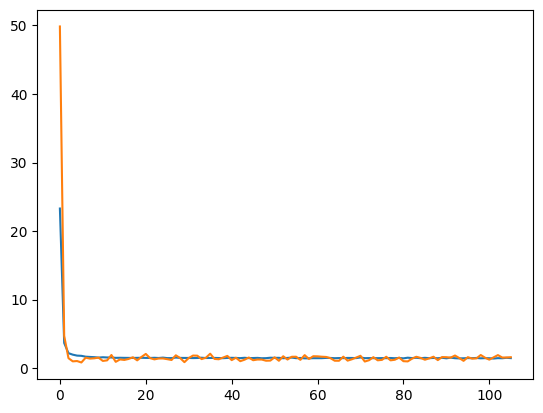

In [46]:
plt.plot(train_curve)
plt.plot(valid_curve)

In [47]:
iwvi.save(ckpt_key="policy_evaluation")

iwvi save ckpt1, ckpt2 ckpt_iwvi_basepartpendulum_policy_evaluation ckpt_iwvi_pendulum_policy_evaluation
base save ckpt ckpt_basevi_pendulum_policy_evaluation
base load self.initial_belief.data.sum() tensor(-0.4380)
base load dec.state_dict()['net_phat.0.weight'].sum() tensor(-3.4642)


In [48]:
loss_array = np.array(loss_list)
print(loss_array)

[[-0.56940248 -0.38960291]
 [-1.05449151 -0.73241717]
 [-0.63670519 -0.4603198 ]
 [-0.73491218 -0.50654063]]


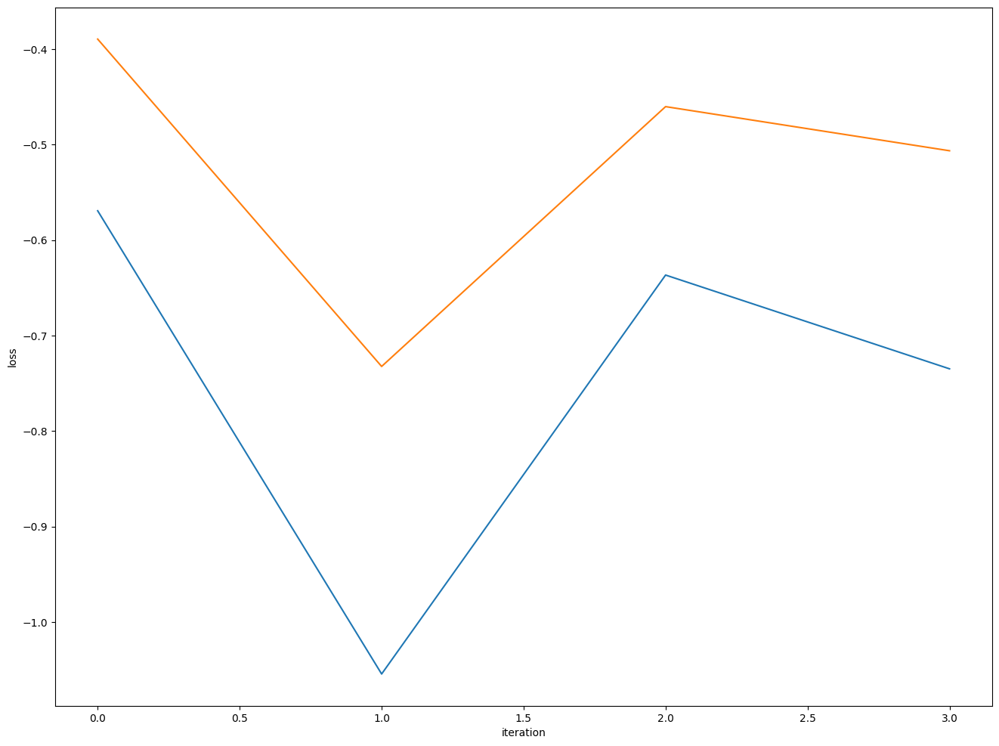

In [49]:
plt.figure(figsize=(16,12))
plt.plot(loss_array[:,0])
plt.plot(loss_array[:,1])
plt.xlabel("iteration")
plt.ylabel("loss")
plt.savefig(figfilenamehead+"learning_curve.png")
plt.savefig(figfilenamehead+"learning_curve.eps")
# plt.savefig(figfilenamehead+"policy_evaluartion_learning_curve.pdf")

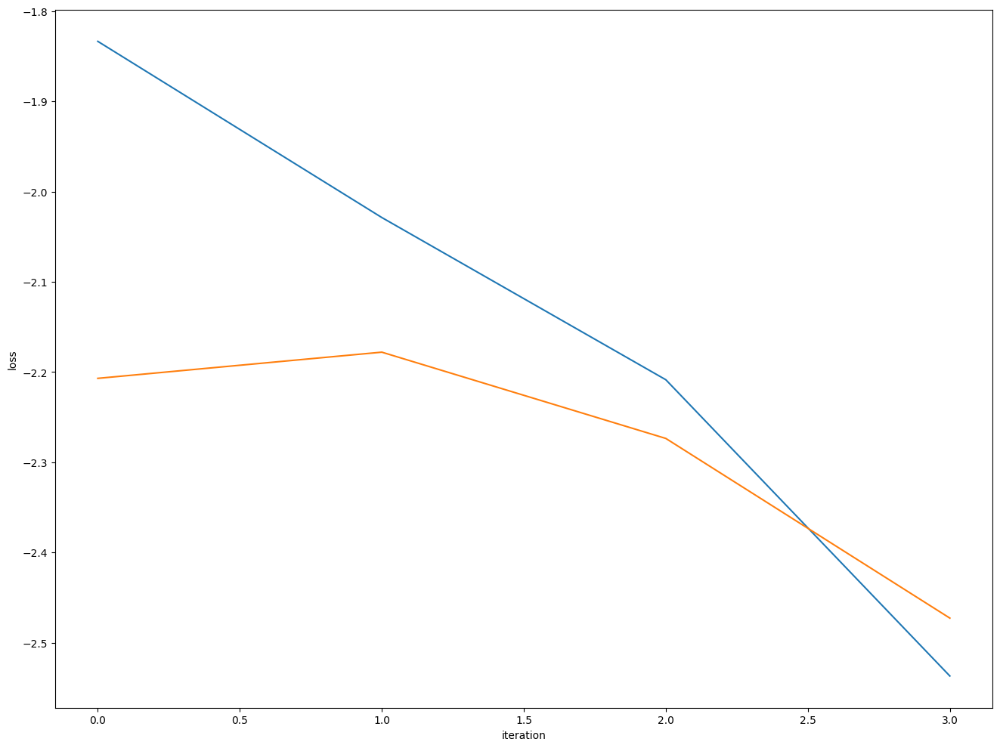

In [50]:
normalized_loss_array = np.array(normalized_loss_list)
plt.figure(figsize=(16,12))
plt.plot(normalized_loss_array[:,0])
plt.plot(normalized_loss_array[:,1])
plt.xlabel("iteration")
plt.ylabel("loss")
plt.savefig(figfilenamehead+"learning_curve_normalized_"+env_str+".png")
plt.savefig(figfilenamehead+"learning_curve_normalized_"+env_str+".eps")
# plt.savefig(figfilenamehead+"policy_evaluartion_learning_curve_normalized_"+env_str+".pdf")

In [51]:
print(iwvi.dec.state_dict()['net_phat.0.weight'].sum())

tensor(-3.4642)
